### Script for Visually Classifying Transits Flagged as Missing


In [2]:
# import packages
import os
import datetime
import numpy as np
from IPython.display import Image, display
import pandas as pd

Characterize the transits by a) whether or not the transit is visually present in the data, and b) why the transit was likely flagged.
For b), classifications are as follows:

    1 --> significant missing data immediately around transit or data is very sparse  
    2 --> poor fitting (not due to missing data)
    3 --> transit is very shallow and/or errors are very large
    4 --> no clear cause (data seems good, fit seems good, transit is 'missing')
    5 --> anomalous in some other way (to flag for something else, like a large TTV)
    
If the transit is not visible, the classification is probably (4). 
 
Run the following cell after uploading the directory 'Missing_transit_plots_updated'. It will iterate over all the plots and allow you to classify each. 

Enter filename to save your classification:  missing_classifications_5-30-22.csv


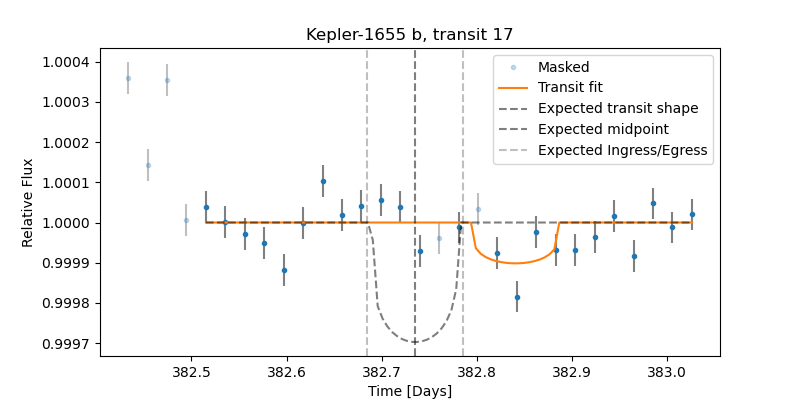

Transit is visually identifiable (y/n):  n
 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> transit is very shallow and/or errors are very large 
 4 --> no clear cause (data seems good, fit seems good, transit is 'missing') 
 5 --> anomalous in some other way (to flag for something else) 
 Transit characterization (1/2/3/4/5):  4



You have reached transit 0!



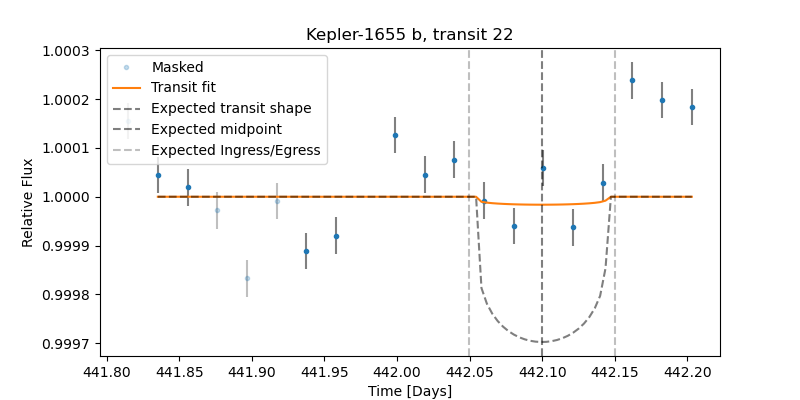

Transit is visually identifiable (y/n):  n
 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> transit is very shallow and/or errors are very large 
 4 --> no clear cause (data seems good, fit seems good, transit is 'missing') 
 5 --> anomalous in some other way (to flag for something else) 
 Transit characterization (1/2/3/4/5):  4


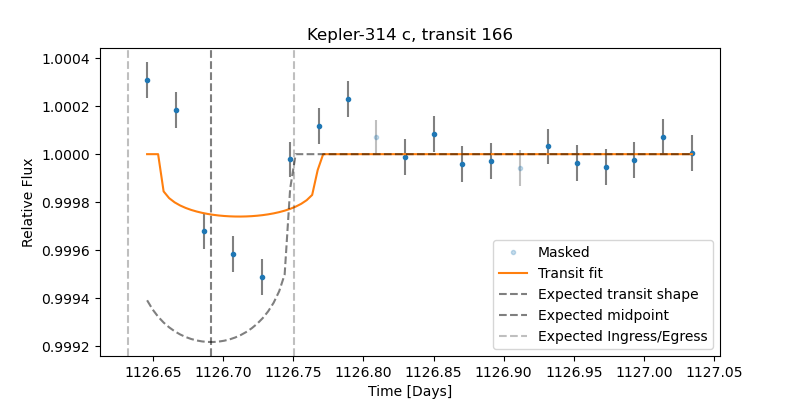

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> transit is very shallow and/or errors are very large 
 4 --> no clear cause (data seems good, fit seems good, transit is 'missing') 
 5 --> anomalous in some other way (to flag for something else) 
 Transit characterization (1/2/3/4/5):  2


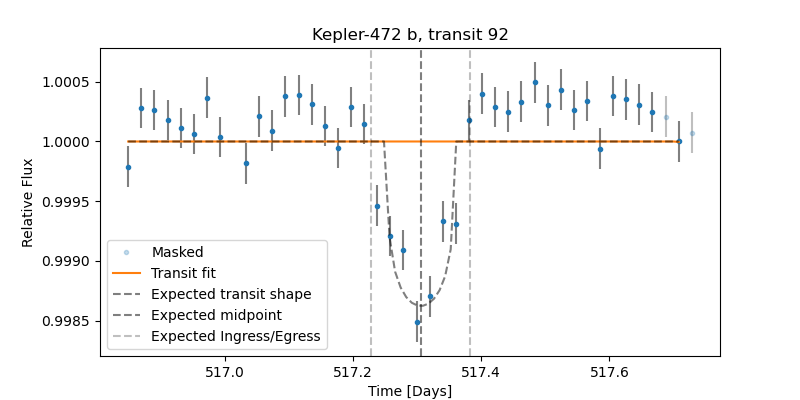

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> transit is very shallow and/or errors are very large 
 4 --> no clear cause (data seems good, fit seems good, transit is 'missing') 
 5 --> anomalous in some other way (to flag for something else) 
 Transit characterization (1/2/3/4/5):  2


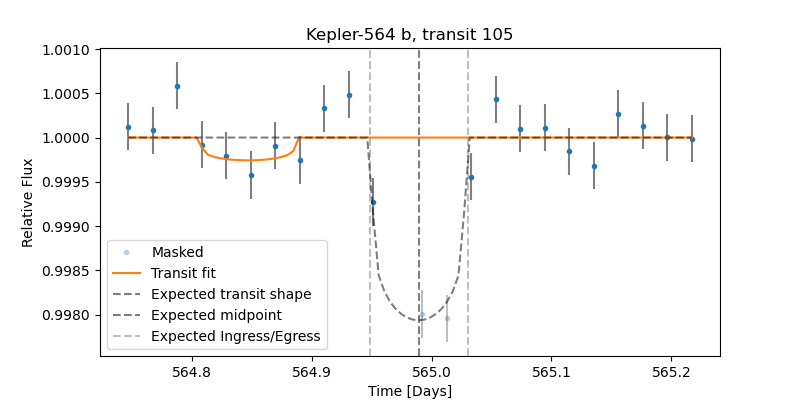

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> transit is very shallow and/or errors are very large 
 4 --> no clear cause (data seems good, fit seems good, transit is 'missing') 
 5 --> anomalous in some other way (to flag for something else) 
 Transit characterization (1/2/3/4/5):  1


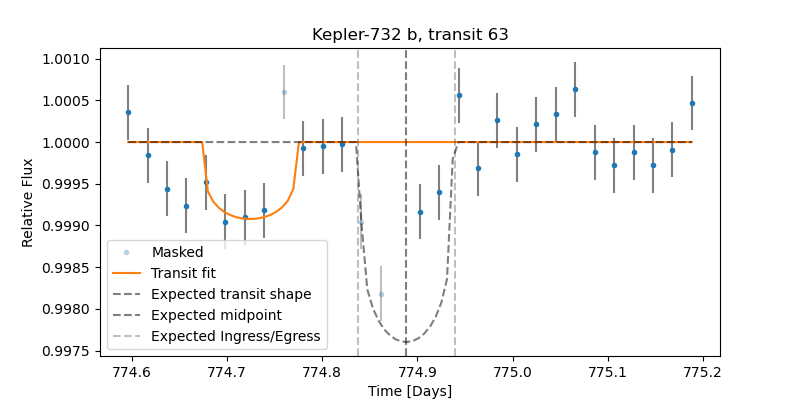

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> transit is very shallow and/or errors are very large 
 4 --> no clear cause (data seems good, fit seems good, transit is 'missing') 
 5 --> anomalous in some other way (to flag for something else) 
 Transit characterization (1/2/3/4/5):  1




Finished classification!


In [3]:
# define output files
dt = datetime.datetime.now()
timestamp = dt.strftime("%d") + dt.strftime("%b") + dt.strftime("%Y") + '-' + dt.strftime("%X")
out_filename = input('Enter filename to save your classification: ')
#out_filename += '_' + timestamp
if not out_filename.endswith('.txt'):
    out_filename += '.txt'

# loop over the plots of all transits flagged as missing
in_path = './Missing_flag_plots_5-30-22' # Modify this as needed 
transit_ids = [name.split('.')[0] for name in sorted(os.listdir(in_path)) if (name.endswith('.png') and not name.startswith('Kepler-76 b') and not name.startswith('Kepler-731 b'))]
visually_present = np.zeros(len(transit_ids)) * np.nan
characterizations = np.zeros(len(transit_ids)) * np.nan

for i in range(len(transit_ids)):
    transit_id = transit_ids[i]
    plot_path = in_path + '/' + transit_id + '.0.png'
    display(Image(filename=plot_path))
    tf = False
    while tf == False:
        transit_present = input('Transit is visually identifiable (y/n): ')
        if transit_present == 'y': visually_present[i] = 1; tf = True
        if transit_present == 'n': visually_present[i] = 0; tf = True
        else: 
            print('Enter y for yes or n for no.')
    tf = False
    while tf == False:
        char = input(' \n 1 --> significant missing data immediately around transit or data is very sparse ' + 
                     '\n 2 --> poor fitting (not due to missing data) ' + 
                     '\n 3 --> transit is very shallow and/or errors are very large ' + 
                     '\n 4 --> no clear cause (data seems good, fit seems good, transit is \'missing\') ' + 
                     '\n 5 --> anomalous in some other way (to flag for something else) \n Transit characterization (1/2/3/4/5): ')
        if (char == '1') | (char == '2') | (char == '3') | (char == '4') | (char == '5') : characterizations[i] = int(char); tf = True
        else: 
            print('Enter 1, 2, 3, or 4 (see descriptions above).')
    print()
    if i % 10 == 0: print('You have reached transit ' + str(int(i)) + '!')   
    print()    
        
data = np.transpose(np.vstack([transit_ids, visually_present, characterizations]))
df = pd.DataFrame(data, columns = ['Transit_ID', 'Visually_identifiable', 'Characterization_code']) 
if os.path.exists(out_filename):
       df.to_csv(out_filename, mode = 'a', index = False, header = False)
else:
    df.to_csv(out_filename, index = False)

print('Finished classification!')

# missing_transit_classification_updated
# ttv_transit_classification_updated

### Script for Visually Classifying Transits Flagged for TTVs


Characterize the transits by a) whether or not the transit is visually present in the data, and b) why the transit was likely flagged.
For b), classifications are as follows:

    1 --> significant missing data immediately around transit or data is very sparse  
    2 --> poor fitting (not due to missing data)
    3 --> the feature it fit was not the transit
    4 --> the fit is essentially flat becuase no clear transit is present
    5 --> the ttv appears to be geniune
    5 --> this doesn't look like much of a TTV to me...

 
Run the following cell after uploading the directory 'TTV_transit_plots_updated'. It will iterate over all the plots and allow you to classify each. 

Enter filename to save your classification:  TTV_classifications_5-30-22.csv


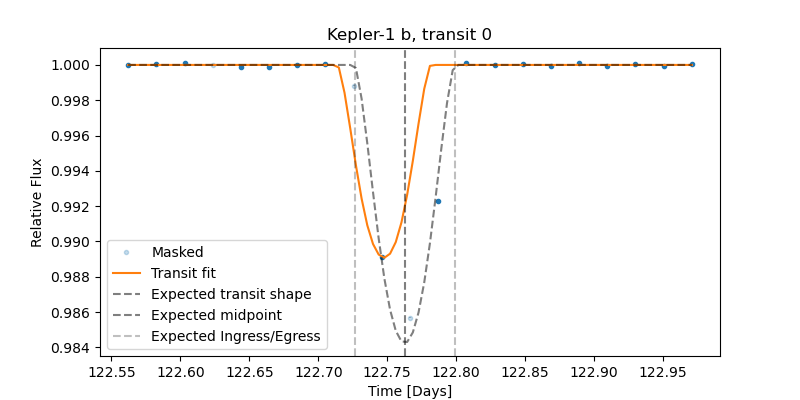

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1



You have reached transit 0!



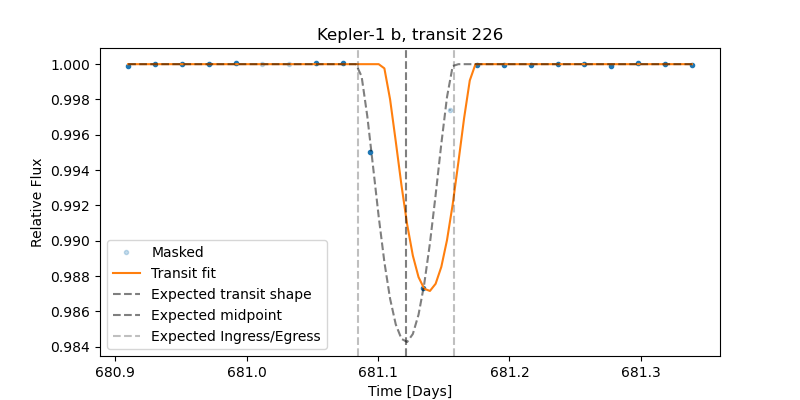

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


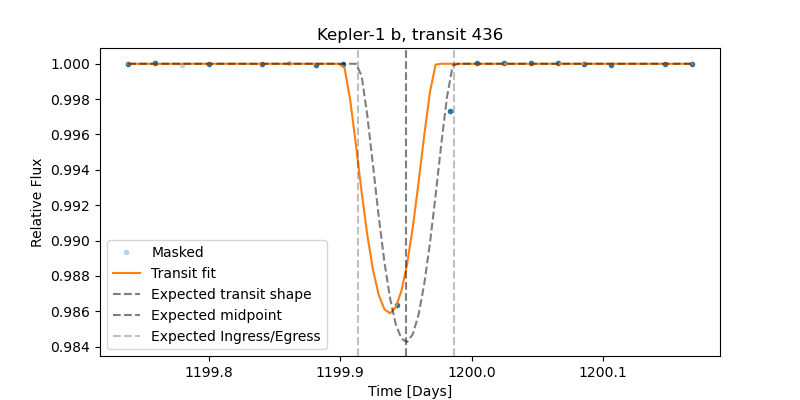

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


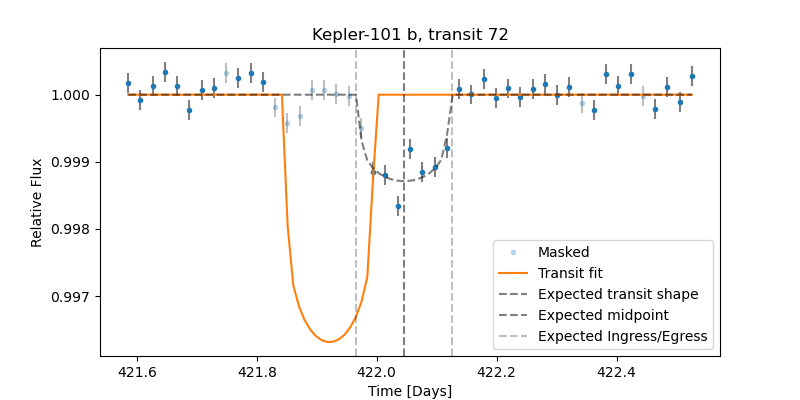

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


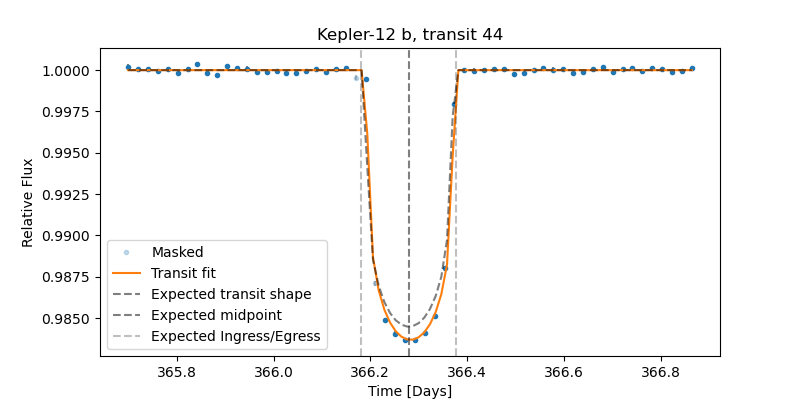

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  6


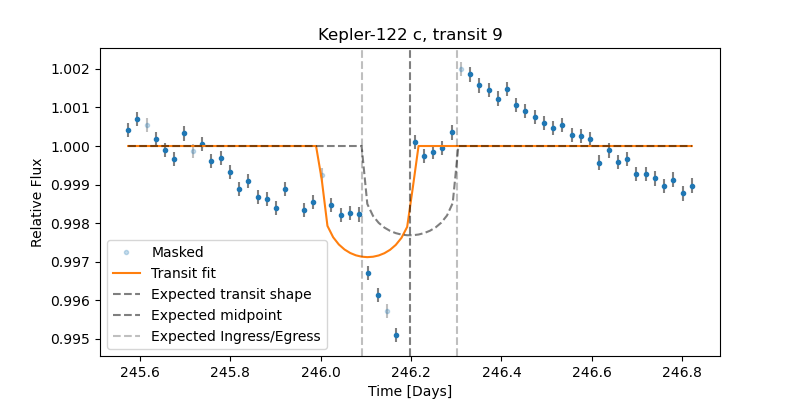

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


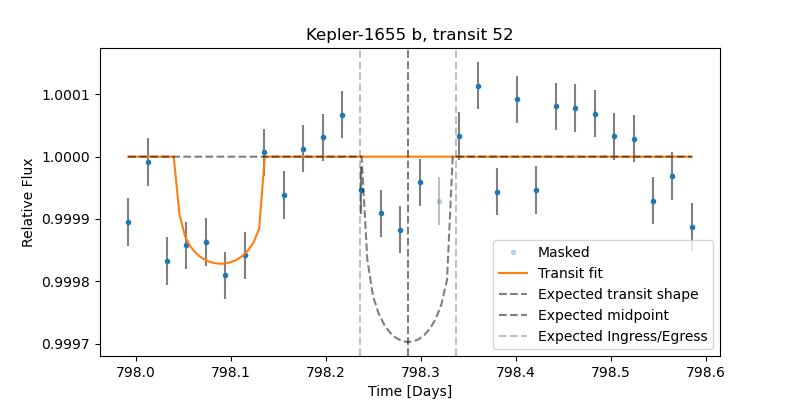

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3


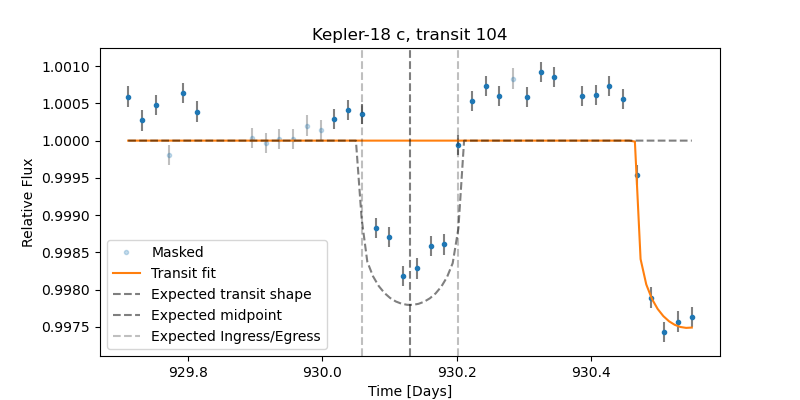

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3


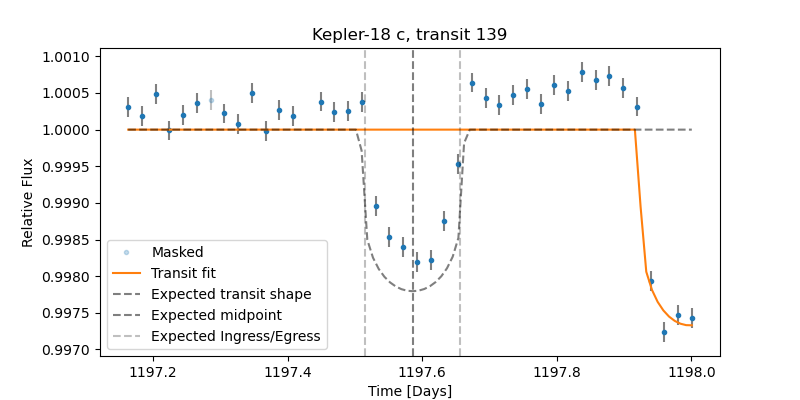

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3


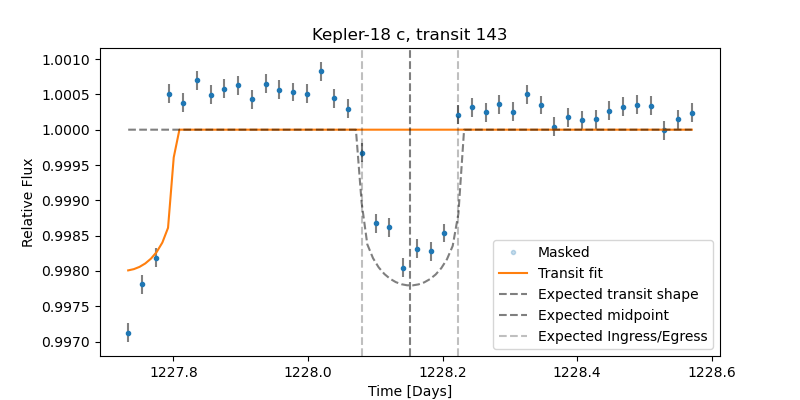

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3


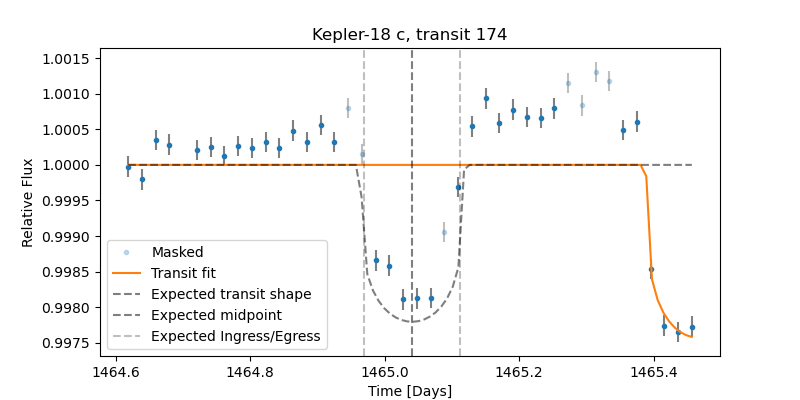

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3



You have reached transit 10!



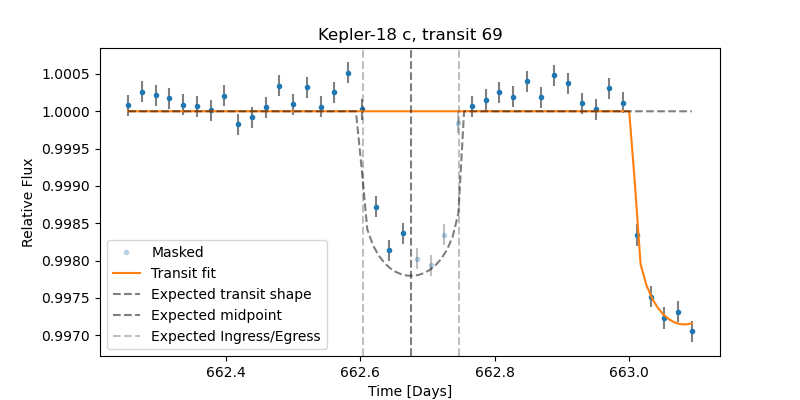

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3


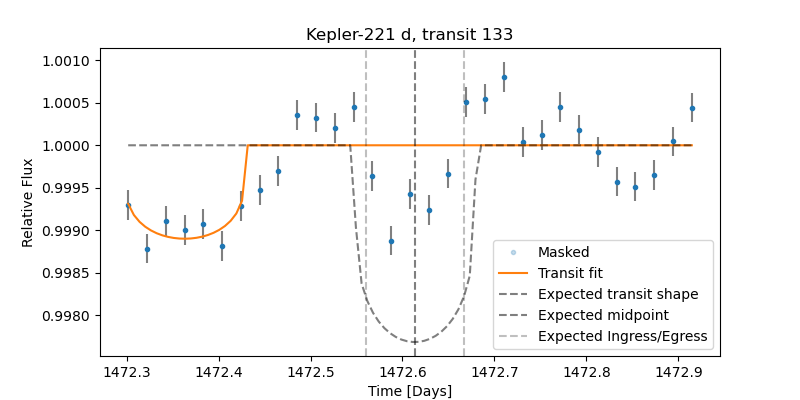

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3


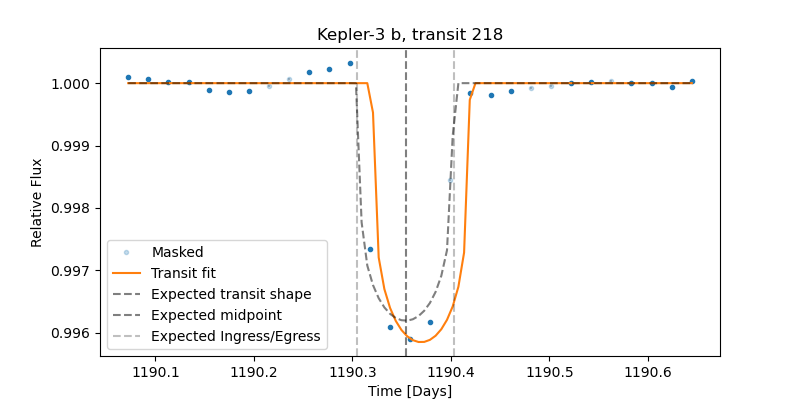

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


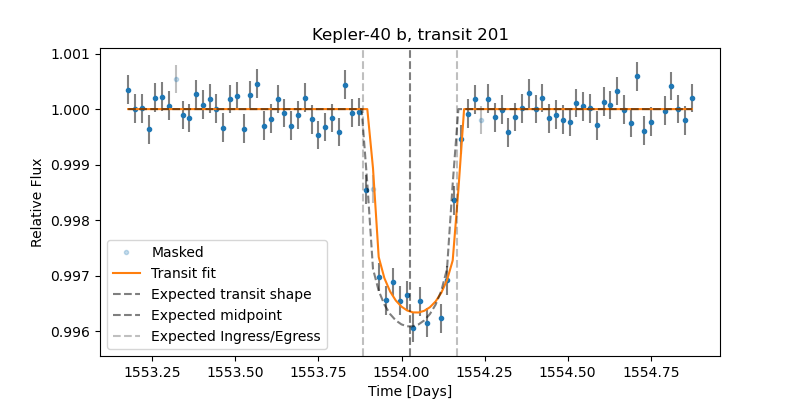

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  6


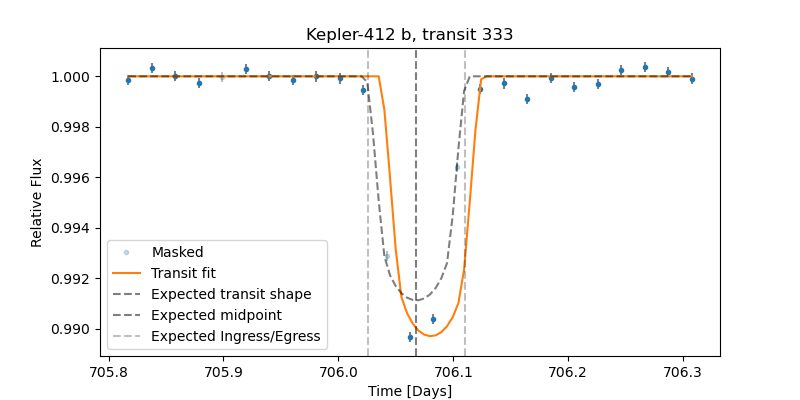

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


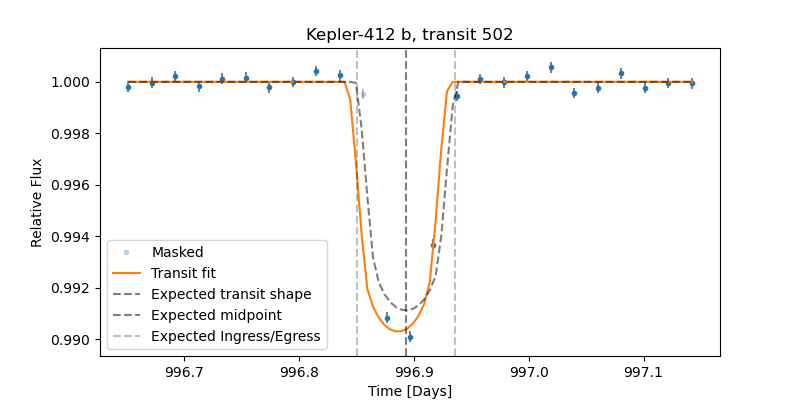

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


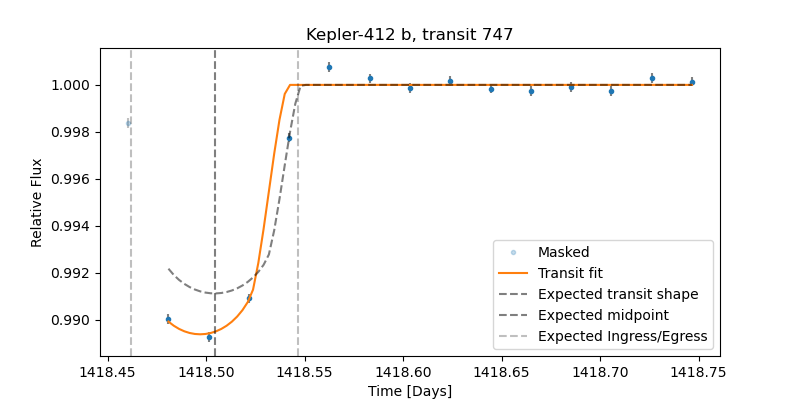

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  6


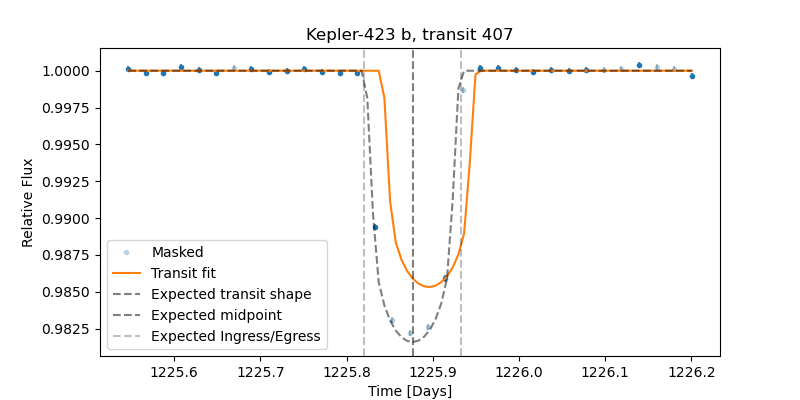

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


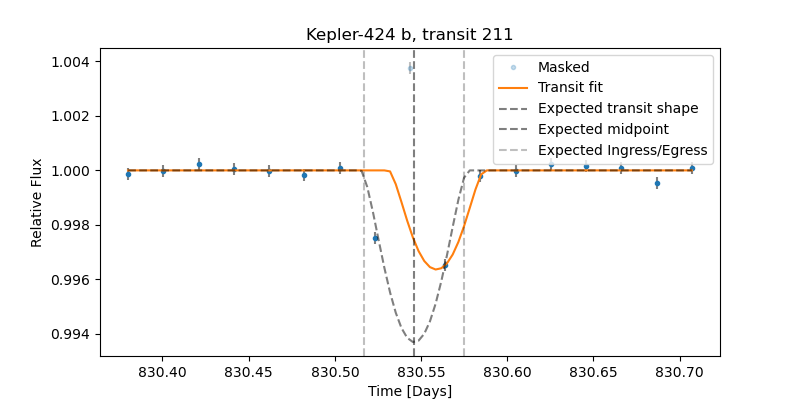

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


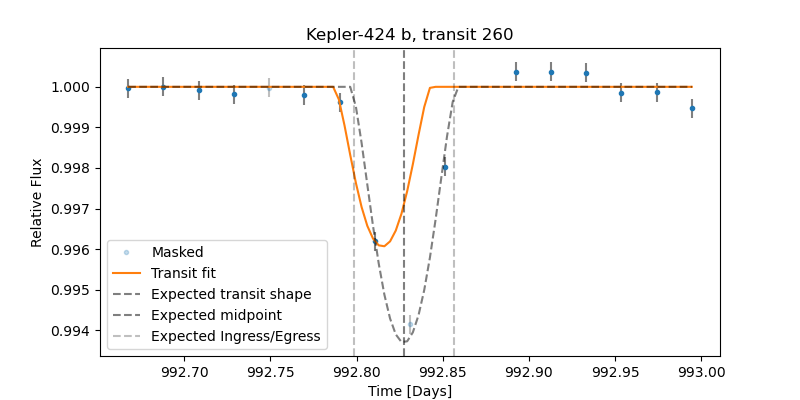

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1



You have reached transit 20!



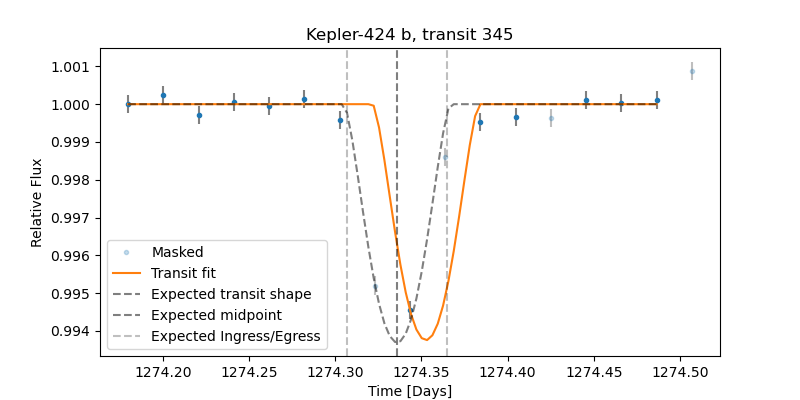

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


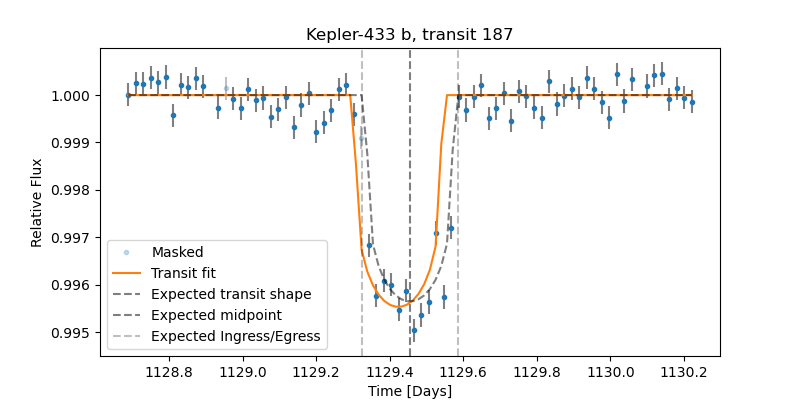

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


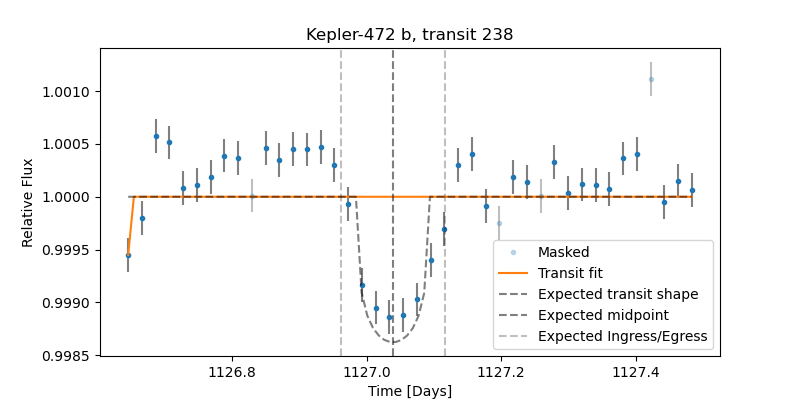

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3


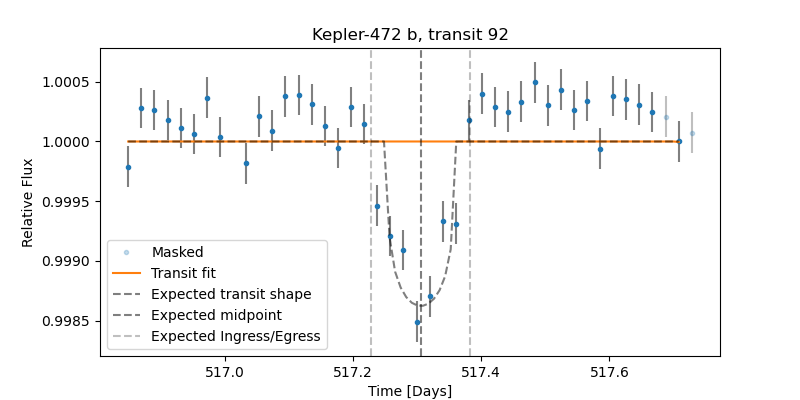

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


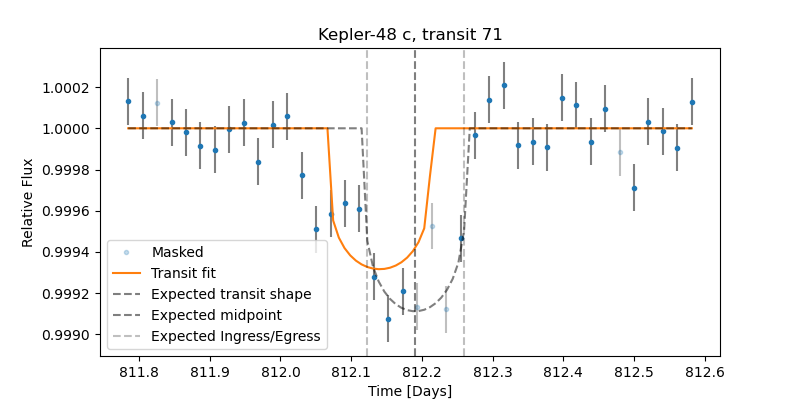

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


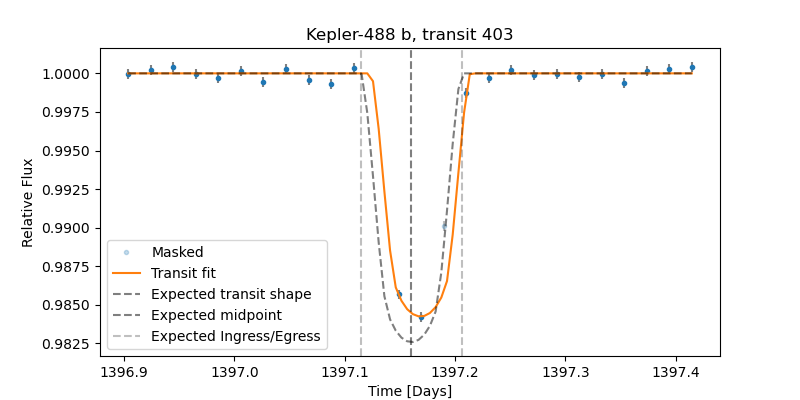

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


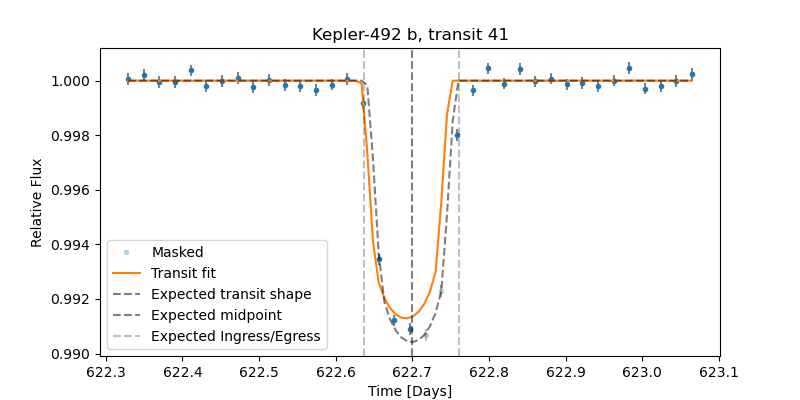

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


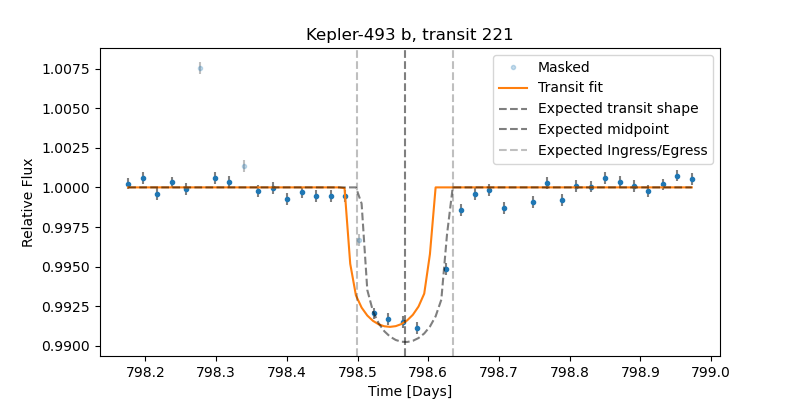

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


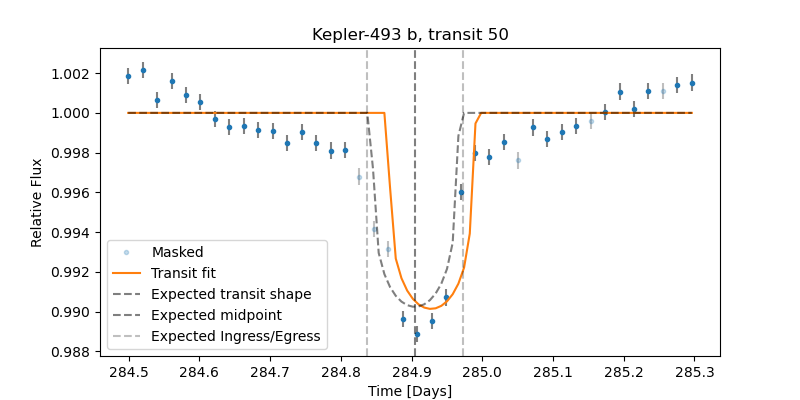

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


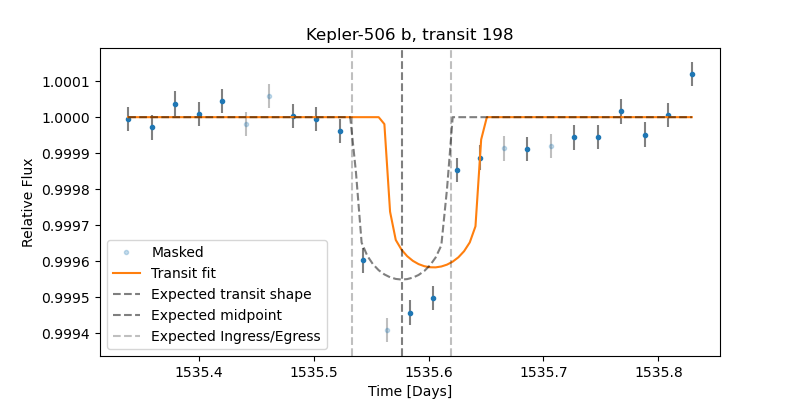

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2



You have reached transit 30!



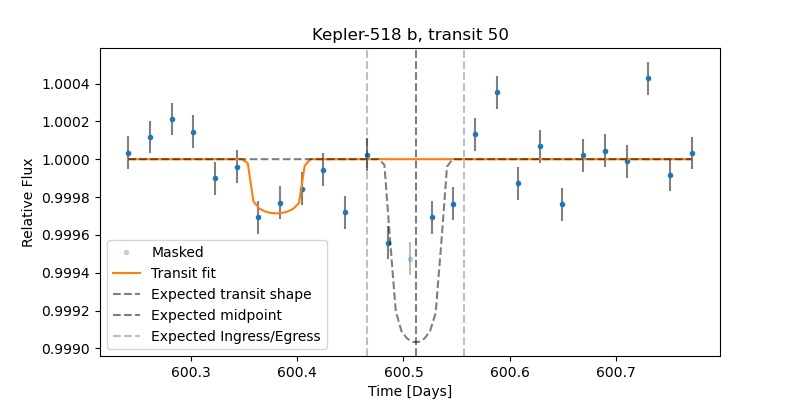

Transit is visually identifiable (y/n):  n
 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3


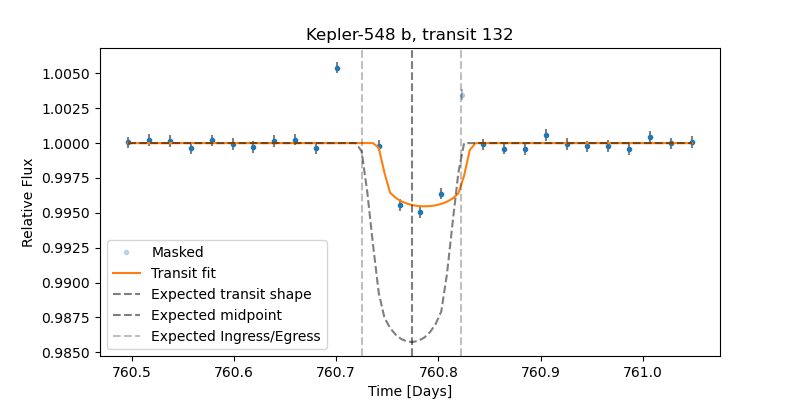

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  5


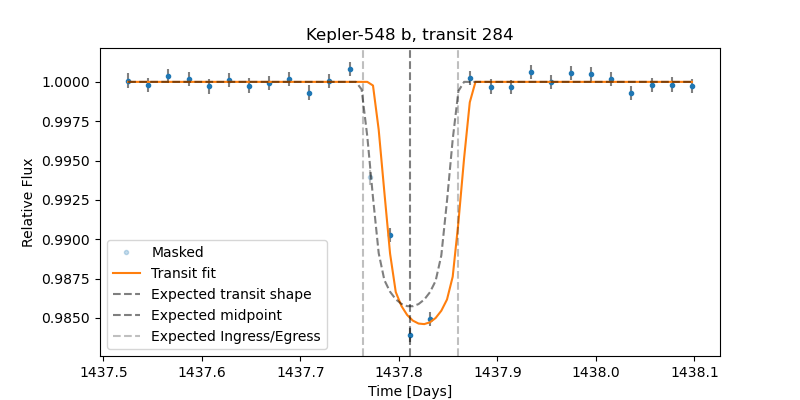

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  5


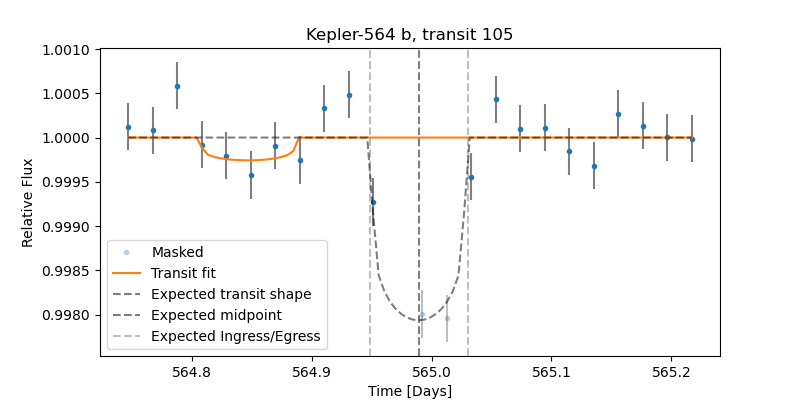

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


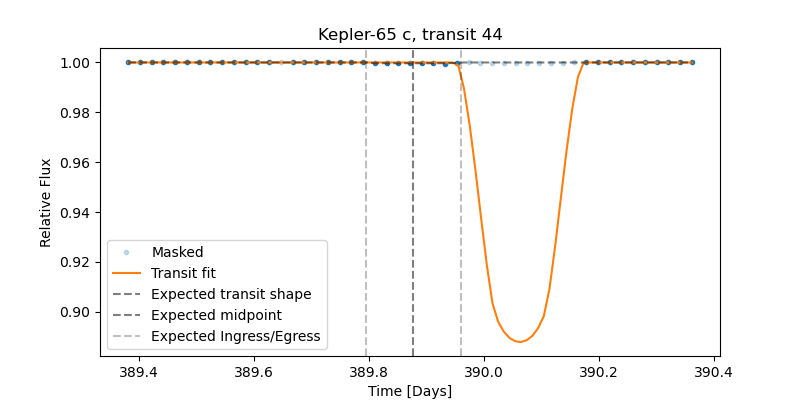

Transit is visually identifiable (y/n):  n
 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


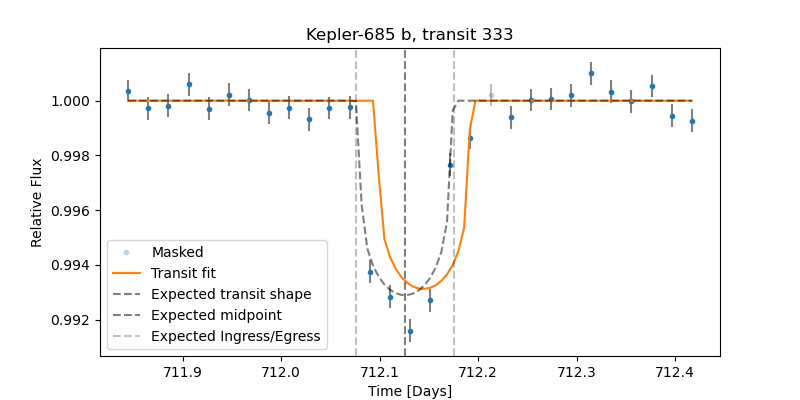

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


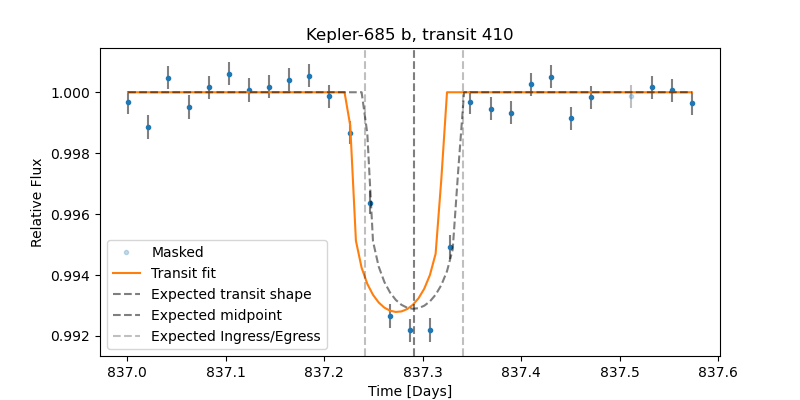

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


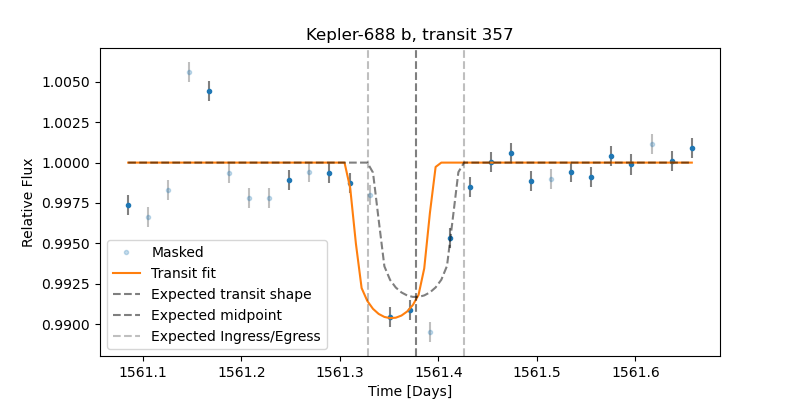

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


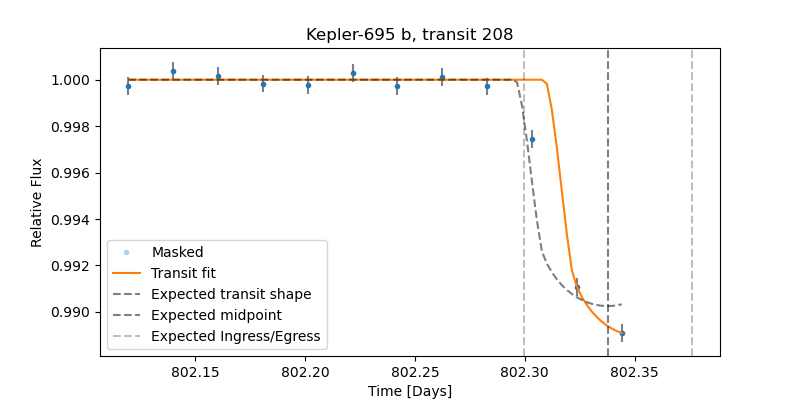

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


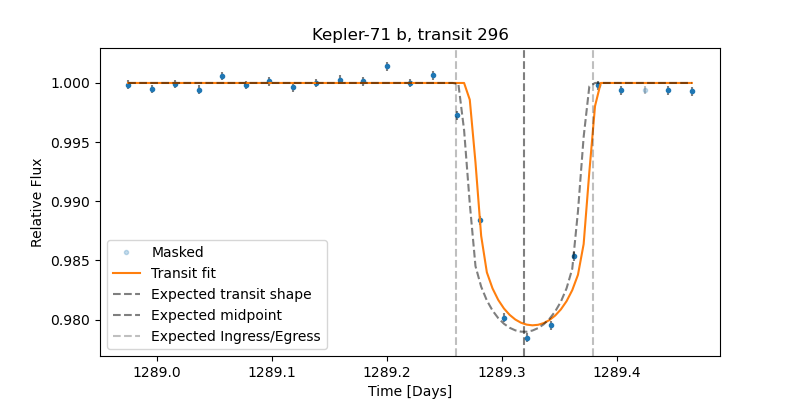

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  6



You have reached transit 40!



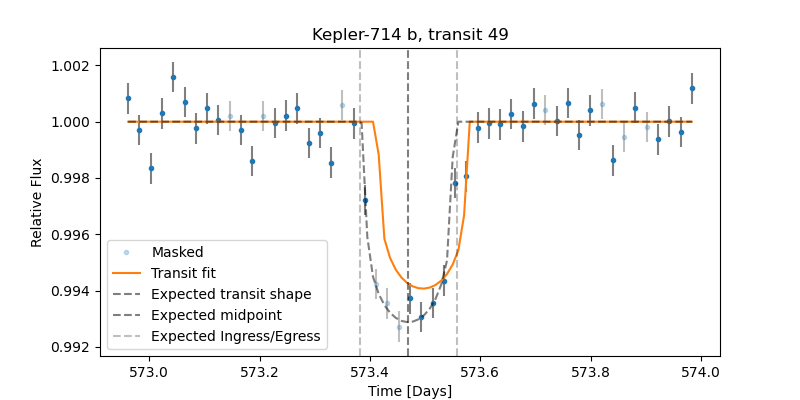

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


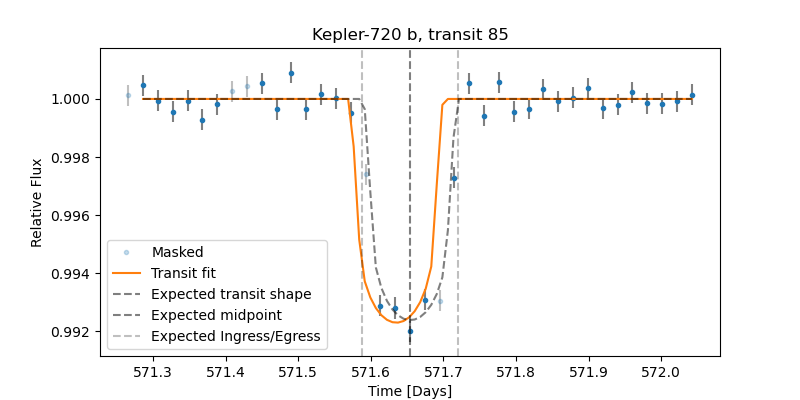

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


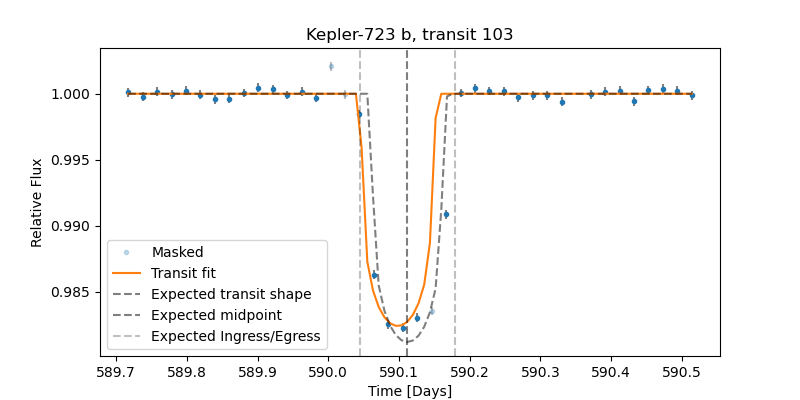

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


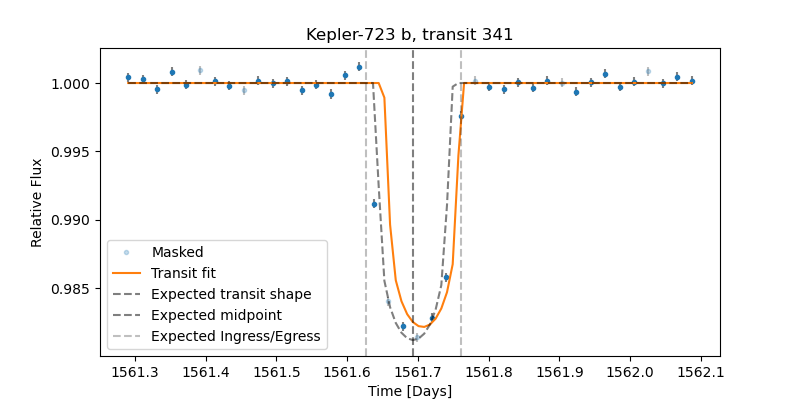

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


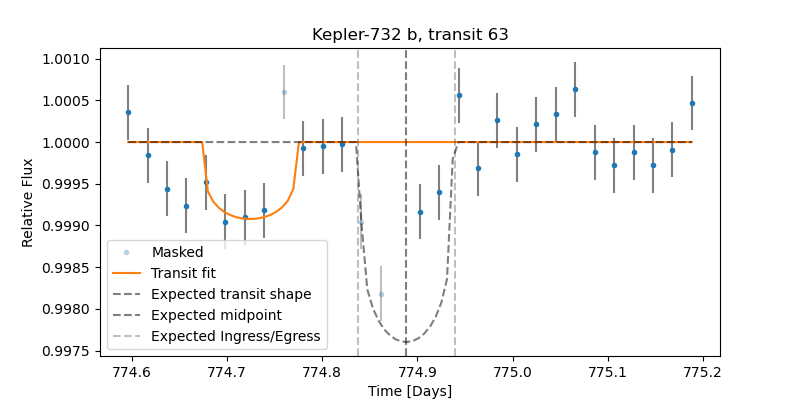

Transit is visually identifiable (y/n):  n
 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  3


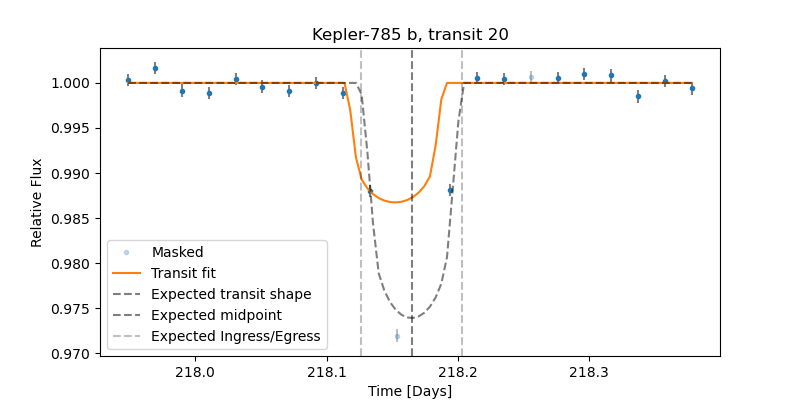

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  1


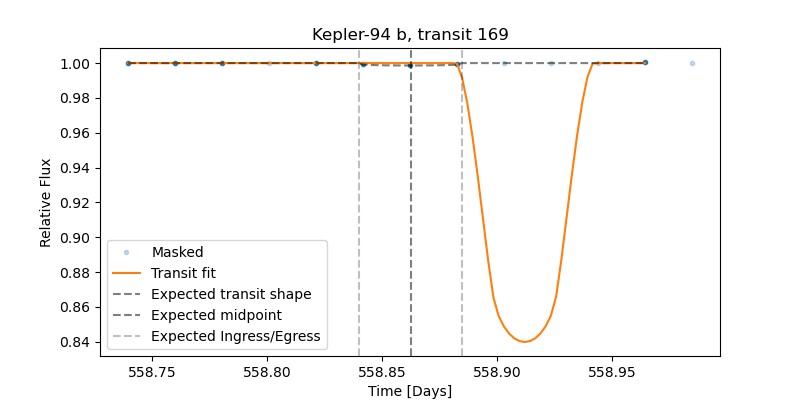

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


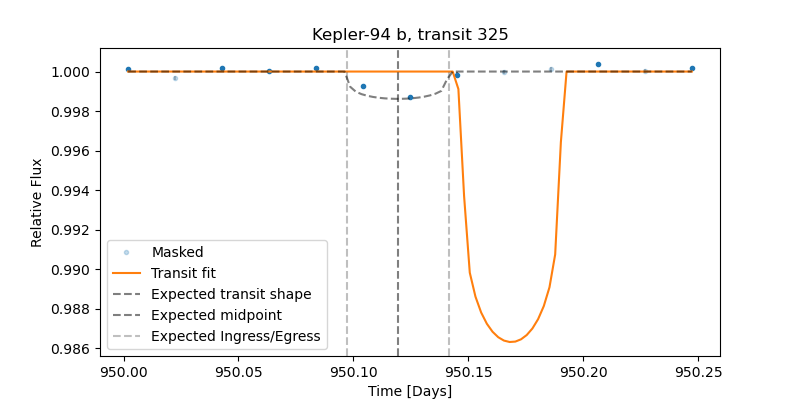

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


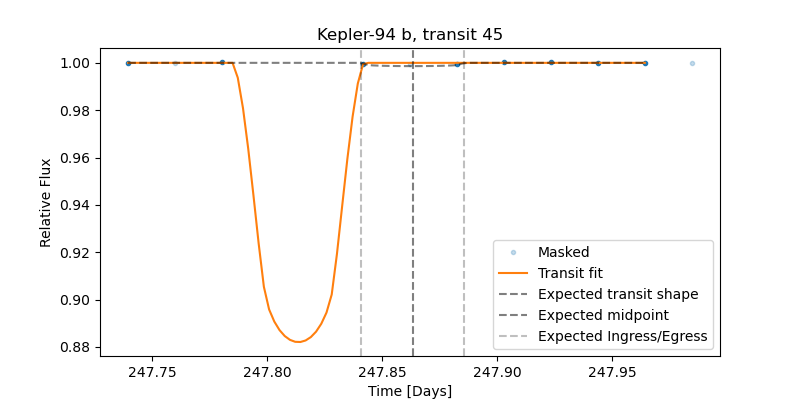

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2


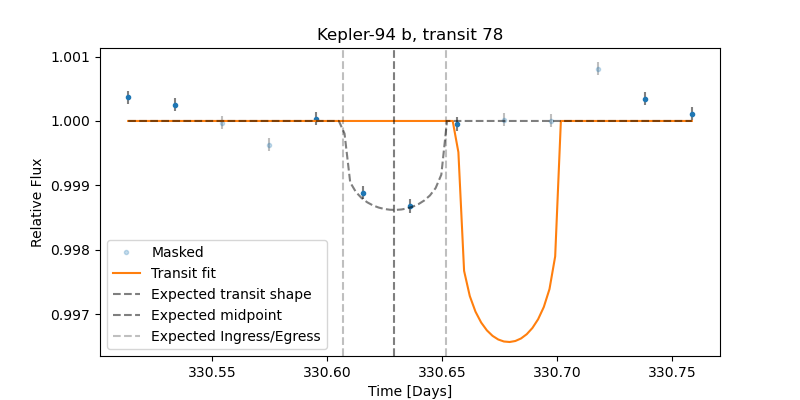

Transit is visually identifiable (y/n):  y


Enter y for yes or n for no.


 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) 
 3 --> the feature it fit was not the transit 
 4 --> the fit is essentially flat becuase no clear transit is present 
 5 --> the ttv appears genuine
 6 --> this doesn't look like much of a TTV to me...
 Transit characterization (1/2/3/4/5):  2



You have reached transit 50!

Finished classification!


In [4]:
### define output files
dt = datetime.datetime.now()
timestamp = dt.strftime("%d") + dt.strftime("%b") + dt.strftime("%Y") + '-' + dt.strftime("%X")
out_filename = input('Enter filename to save your classification: ')
#out_filename += '_' + timestamp
if not out_filename.endswith('.txt'):
    out_filename += '.txt'

# loop over the plots of all transits flagged as missing
in_path = './TTV_flag_plots_5-30-22' # Modify this as needed 
transit_ids = [name.split('.')[0] for name in sorted(os.listdir(in_path)) if (name.endswith('.png') and not name.startswith('Kepler-76 b') and not name.startswith('Kepler-731 b'))]
visually_present = np.zeros(len(transit_ids)) * np.nan
characterizations = np.zeros(len(transit_ids)) * np.nan

for i in range(len(transit_ids)):
    transit_id = transit_ids[i]
    plot_path = in_path + '/' + transit_id + '.0.png'
    display(Image(filename=plot_path))
    tf = False
    while tf == False:
        transit_present = input('Transit is visually identifiable (y/n): ')
        if transit_present == 'y': visually_present[i] = 1; tf = True
        if transit_present == 'n': visually_present[i] = 0; tf = True
        else: 
            print('Enter y for yes or n for no.')
    tf = False
    while tf == False:
        char = input(' \n 1 --> significant missing data immediately around transit or data is very sparse ' + 
                     '\n 2 --> poor fitting (not due to missing data) ' + 
                     '\n 3 --> the feature it fit was not the transit ' + 
                     '\n 4 --> the fit is essentially flat becuase no clear transit is present ' + 
                     '\n 5 --> the ttv appears genuine' +
                     '\n 6 --> this doesn\'t look like much of a TTV to me...' +
                     '\n Transit characterization (1/2/3/4/5): ')
        if (char == '1') | (char == '2') | (char == '3') | (char == '4') | (char == '5') | (char == '6') : characterizations[i] = int(char); tf = True
        else: 
            print('Enter 1, 2, 3, or 4 (see descriptions above).')
    print()
    if i % 10 == 0: print('You have reached transit ' + str(int(i)) + '!')   
    print()    
        
data = np.transpose(np.vstack([transit_ids, visually_present, characterizations]))
df = pd.DataFrame(data, columns = ['Transit_ID', 'Visually_identifiable', 'Characterization_code']) 
if os.path.exists(out_filename):
       df.to_csv(out_filename, mode = 'a', index = False, header = False)
else:
    df.to_csv(out_filename, index = False)

print('Finished classification!')

# missing_transit_classification_updated
# ttv_transit_classification_updated

### Script for Visually Classifying Transits Flagged for Large Depth


Characterize the transits by a) whether or not the transit is visually present in the data, and b) why the transit was likely flagged.
For b), classifications are as follows:

    1 --> significant missing data immediately around transit or data is very sparse  
    2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline due to non-linear stellar variability, etc.)
    3 --> the feature it fit was not the transit
    4 --> the large depth appears to be geniune
    5 --> I suspect another transit is stacked on over this one
    6 --> this doesn't look much too deep to me...

 
Run the following cell after uploading the directory 'Depth_transit_plots_updated'. It will iterate over all the plots and allow you to classify each. 

Enter filename to save your classification:  depth_classification_5-30-22.csv


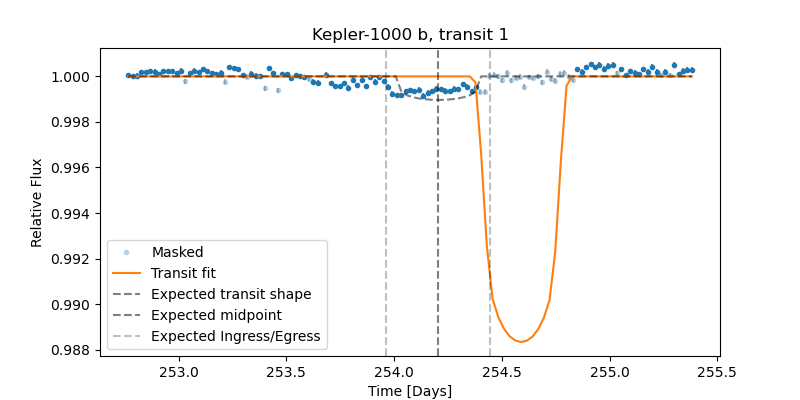

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1



You have reached transit 0!



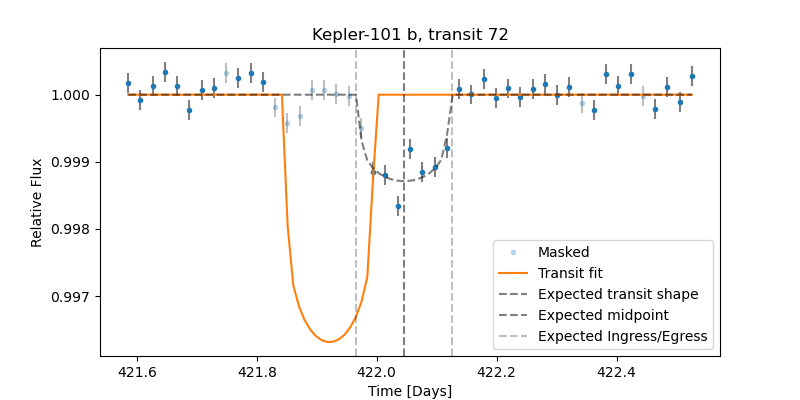

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


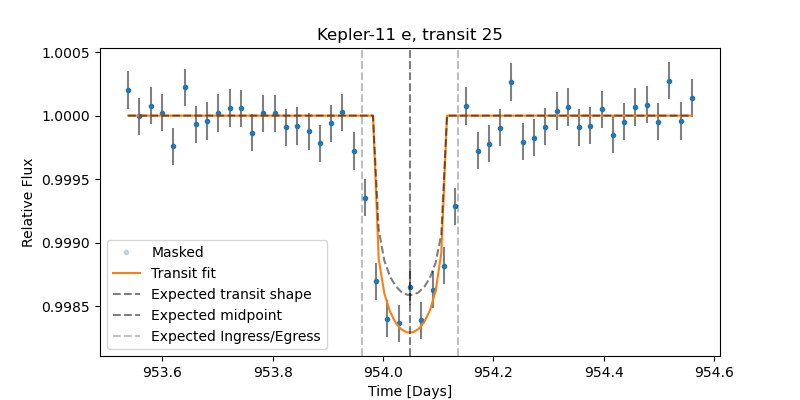

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


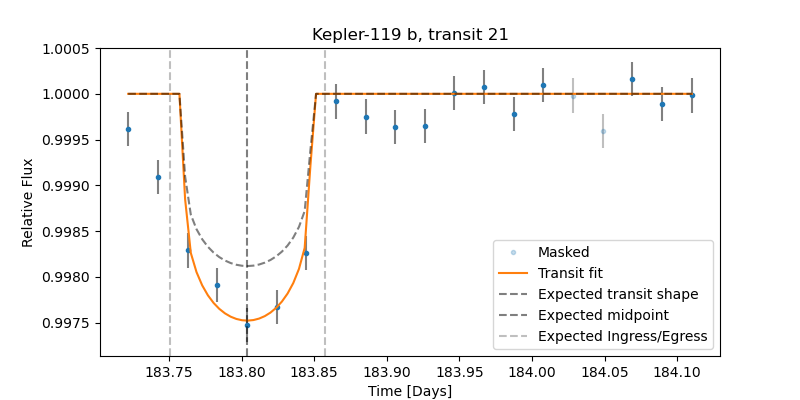

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


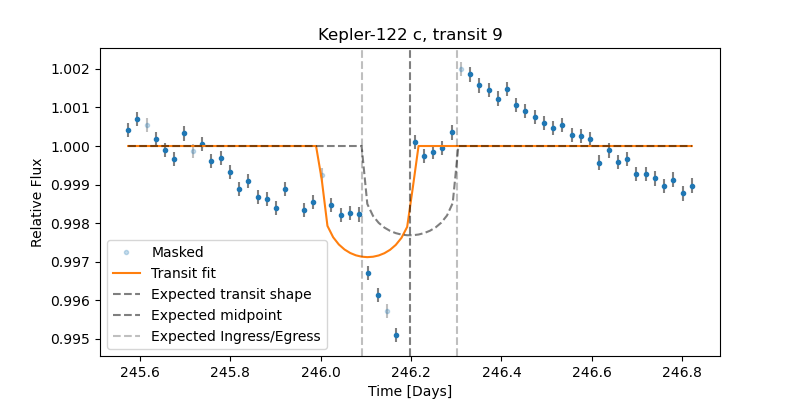

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


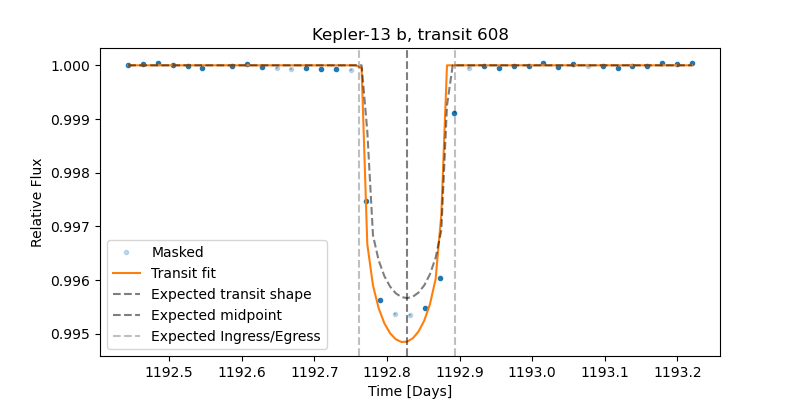

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


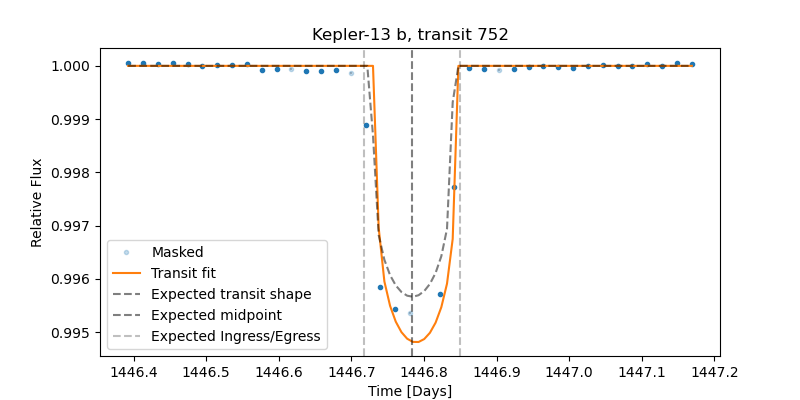

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


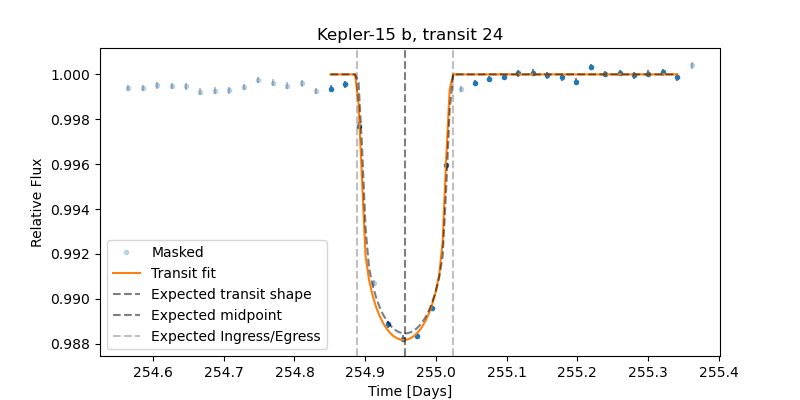

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6


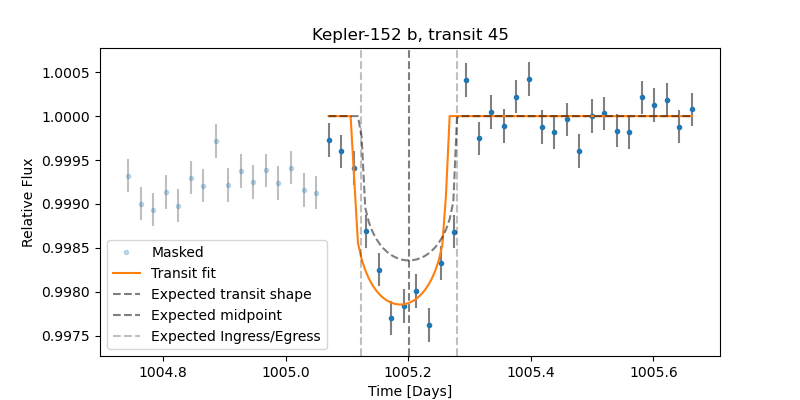

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


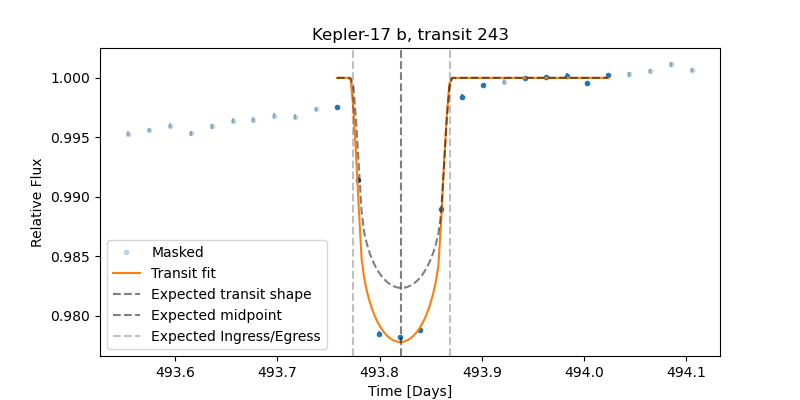

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


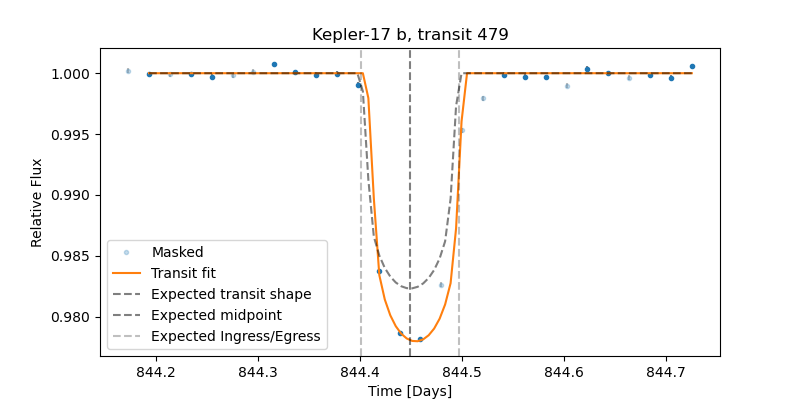

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4



You have reached transit 10!



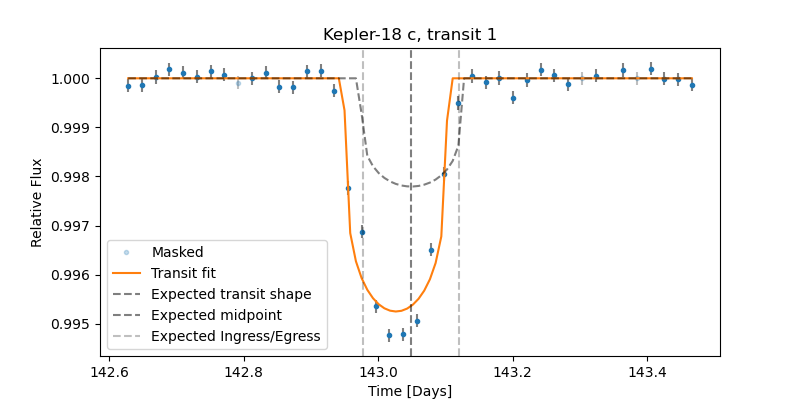

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


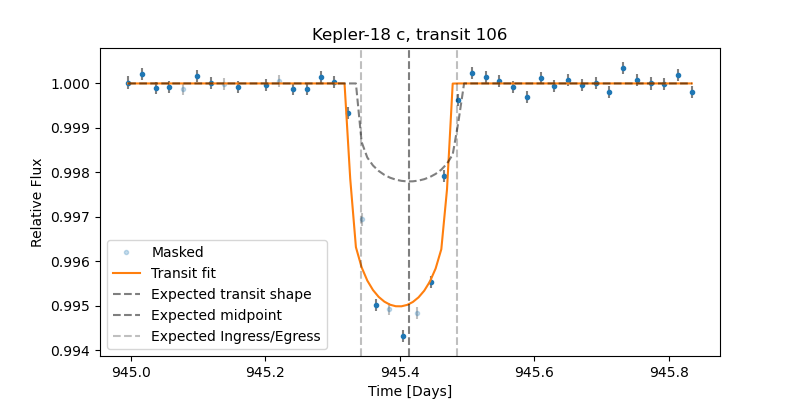

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


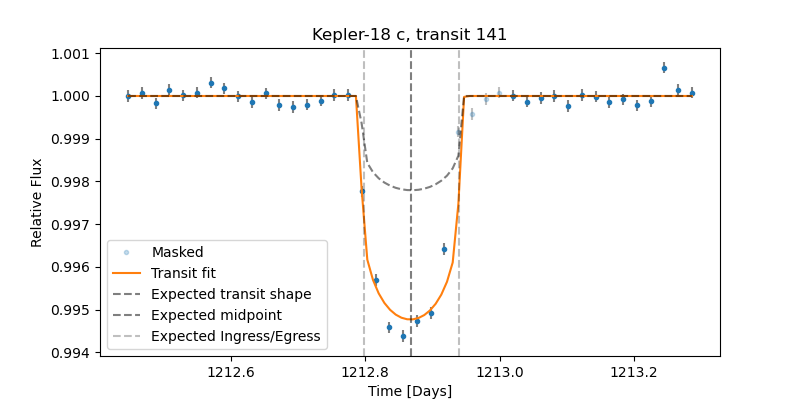

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


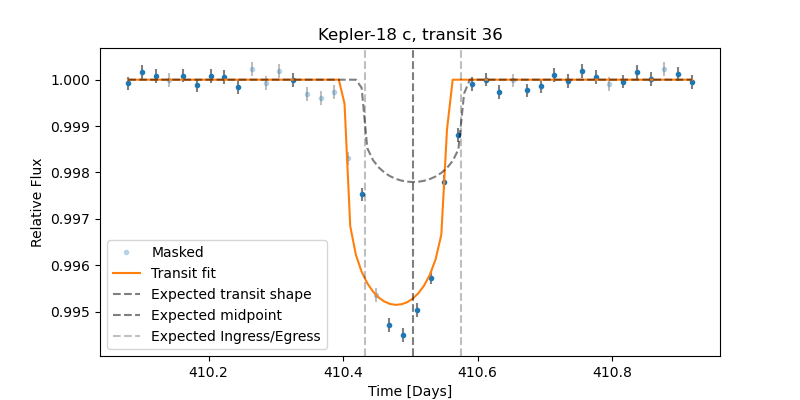

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


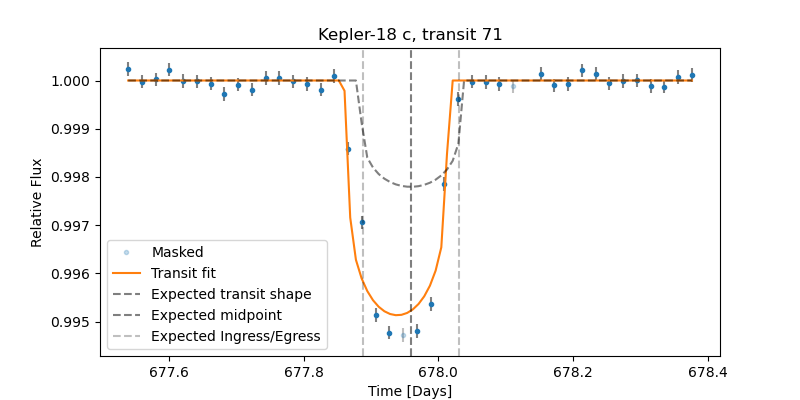

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


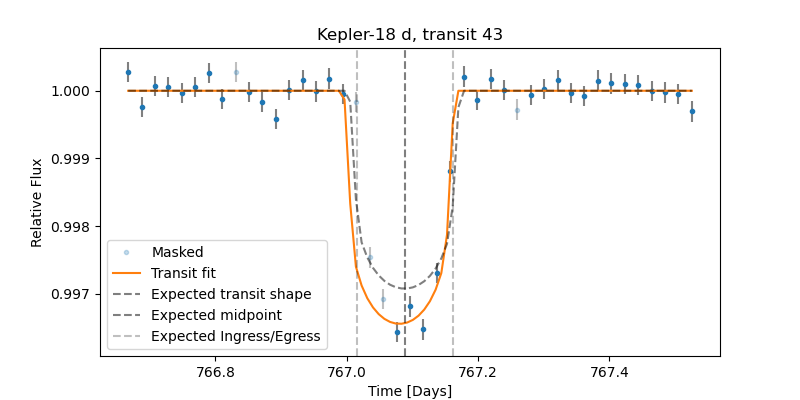

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


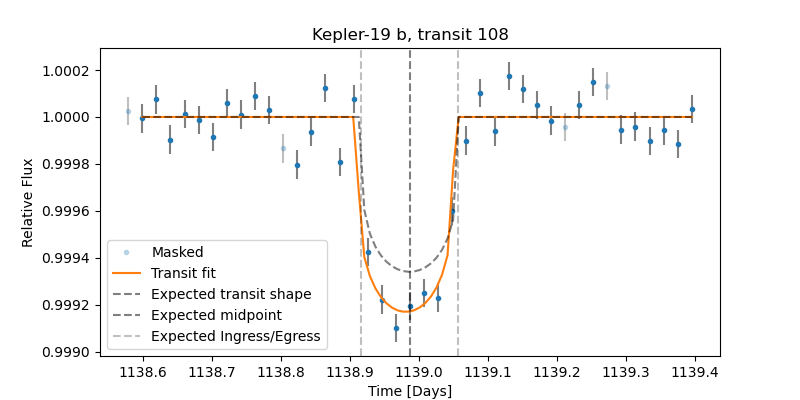

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


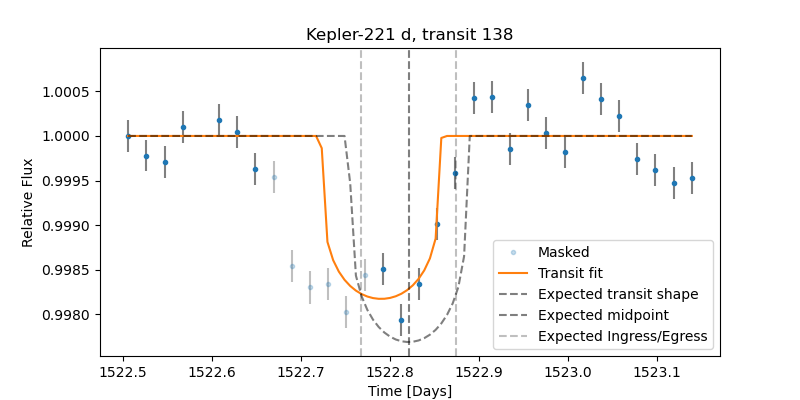

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


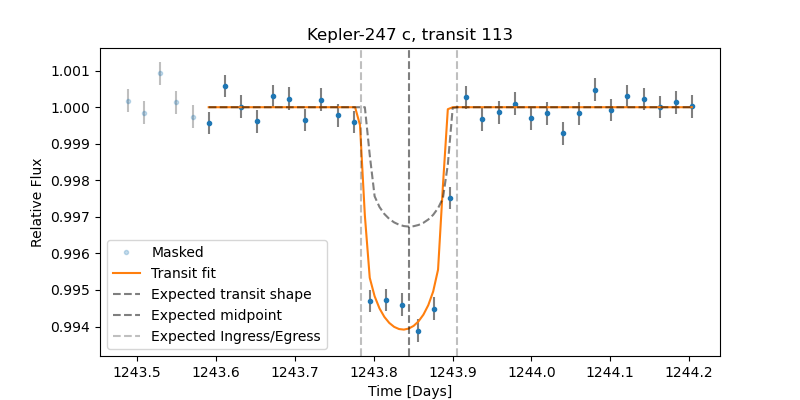

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


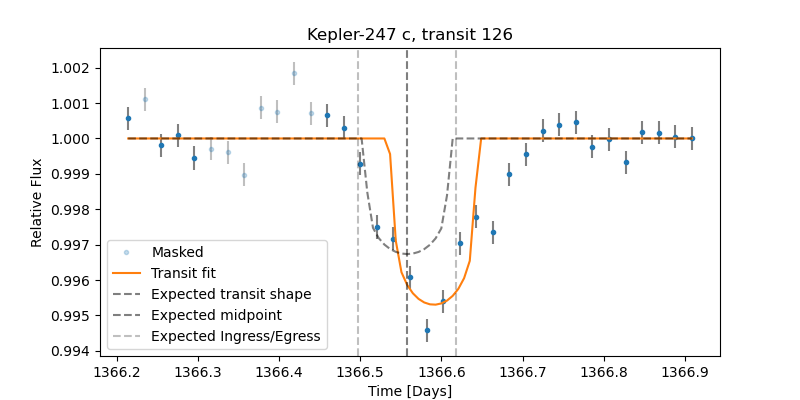

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4



You have reached transit 20!



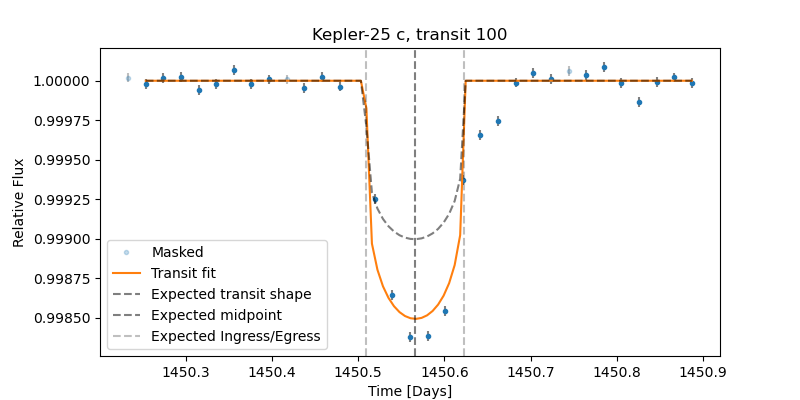

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


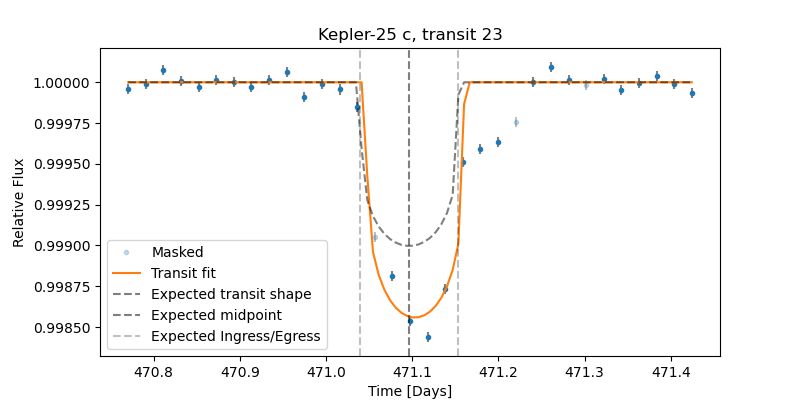

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


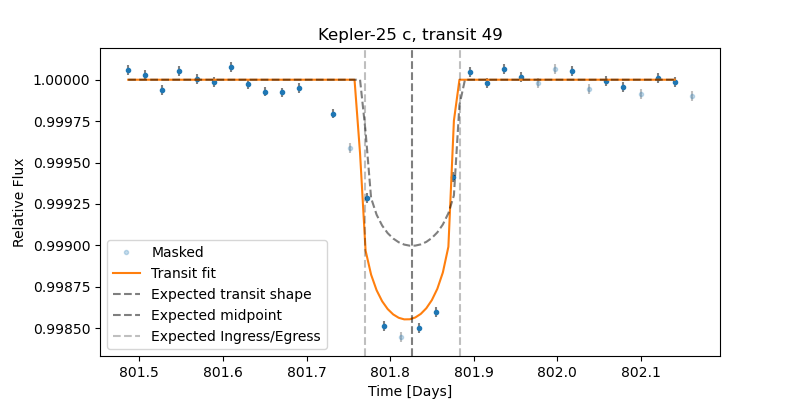

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


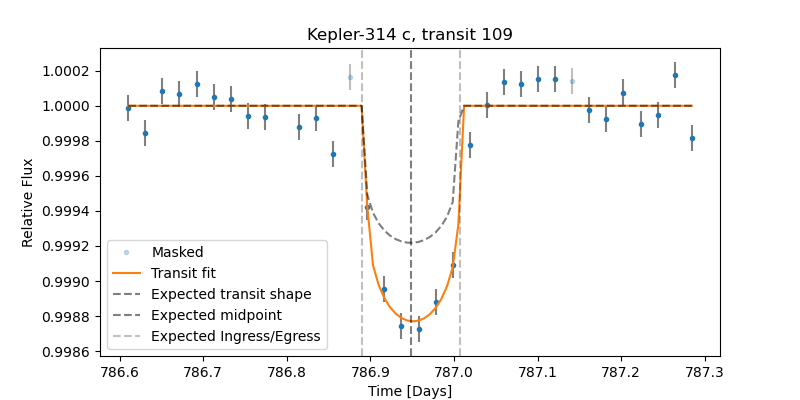

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


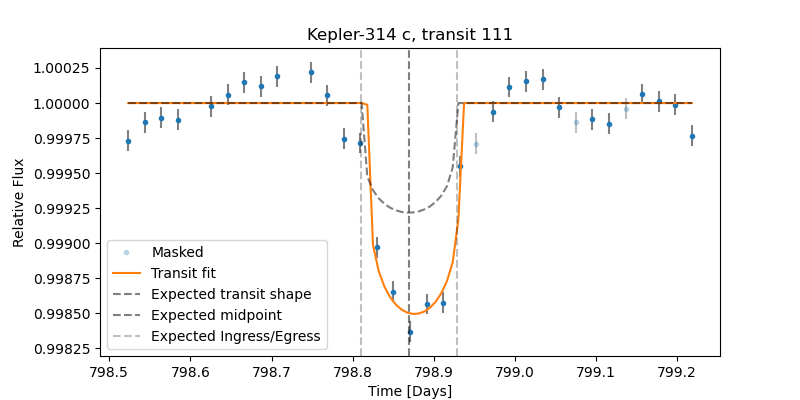

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


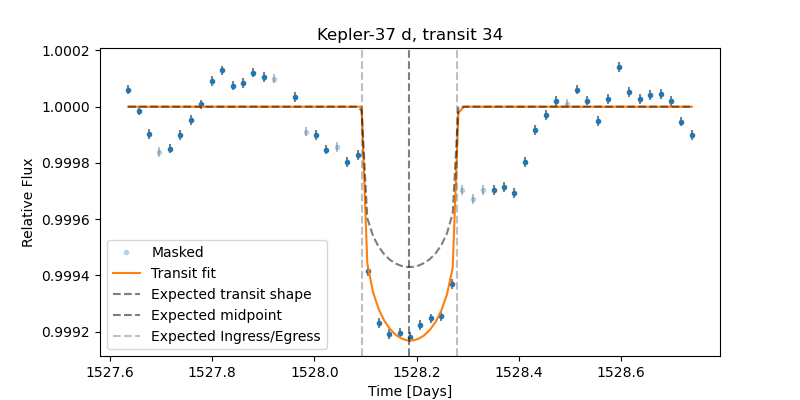

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


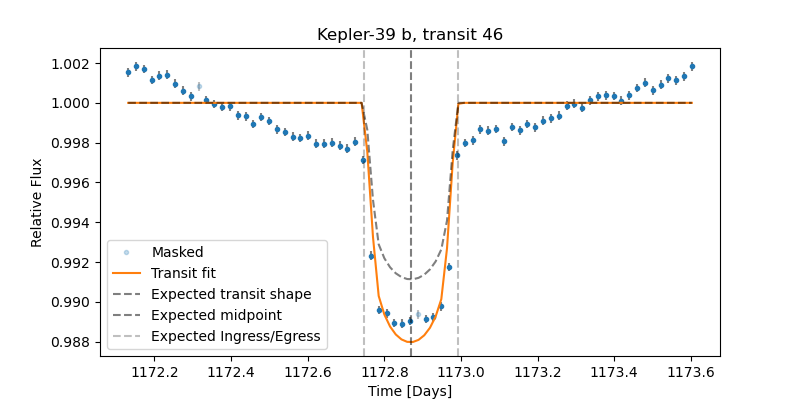

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


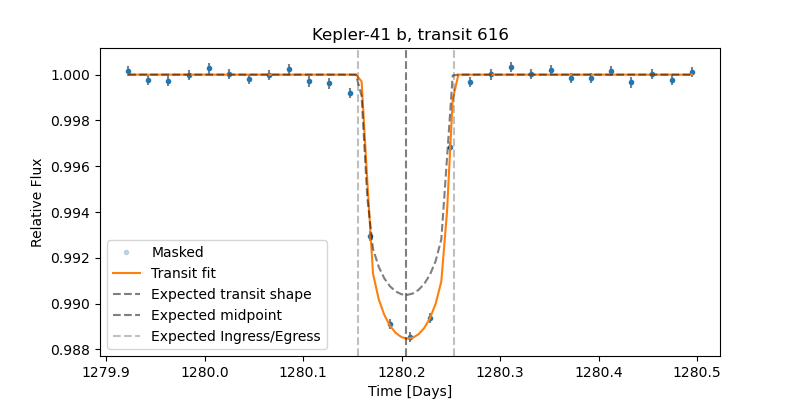

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


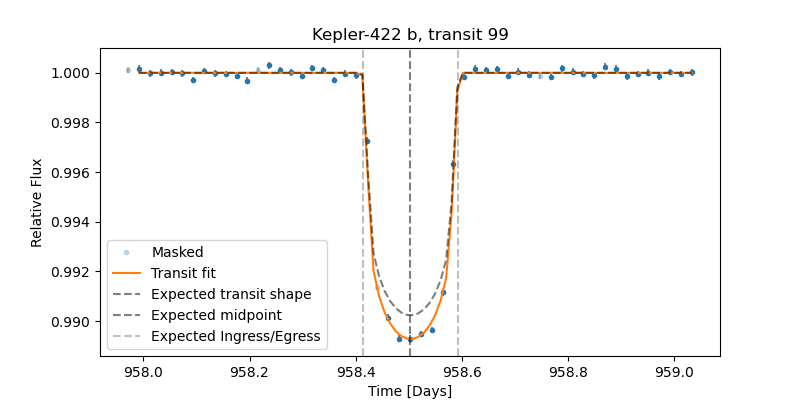

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


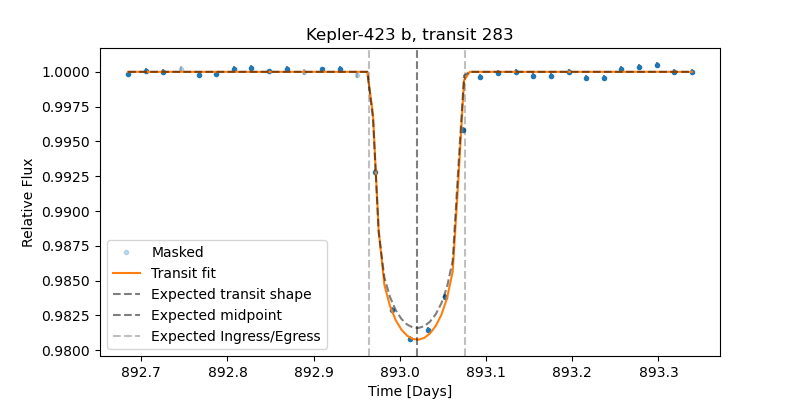

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6



You have reached transit 30!



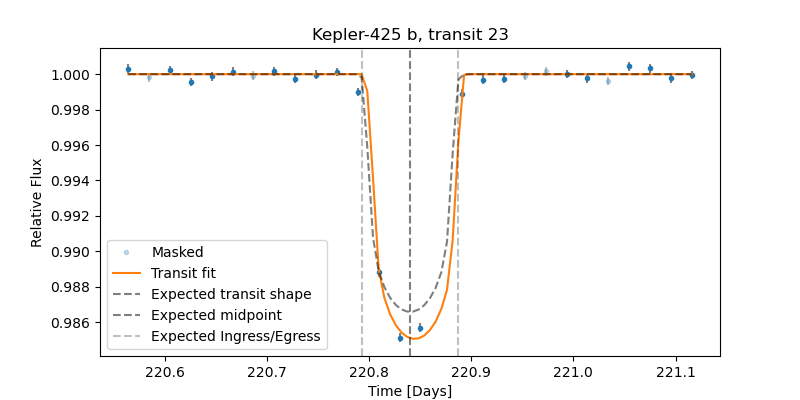

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6


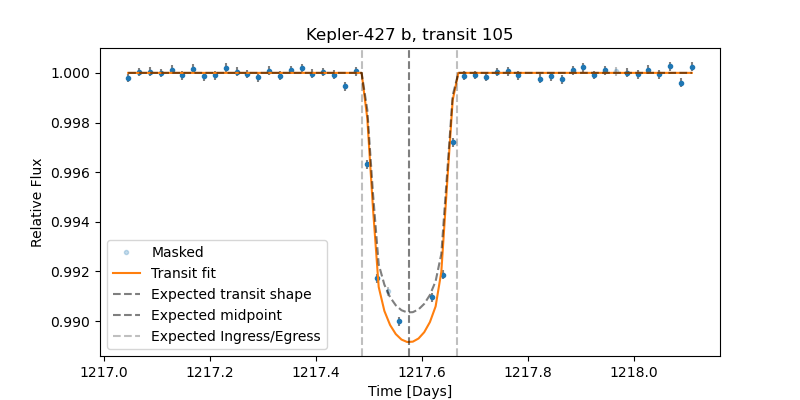

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6


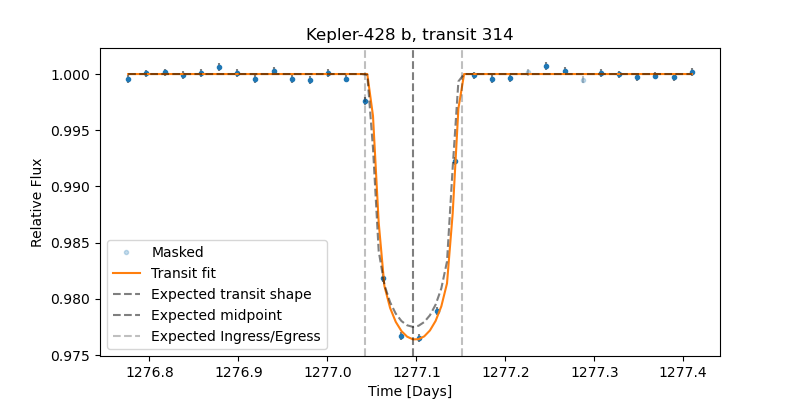

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6


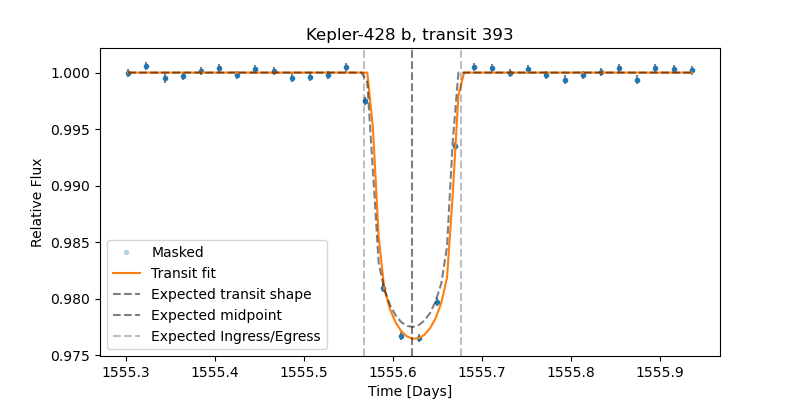

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6


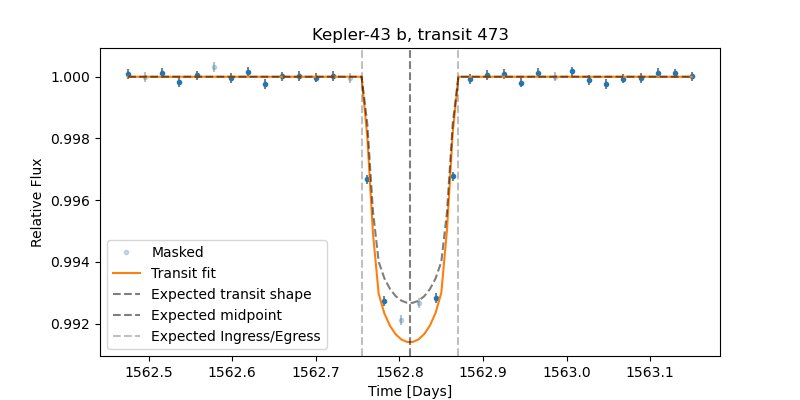

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6


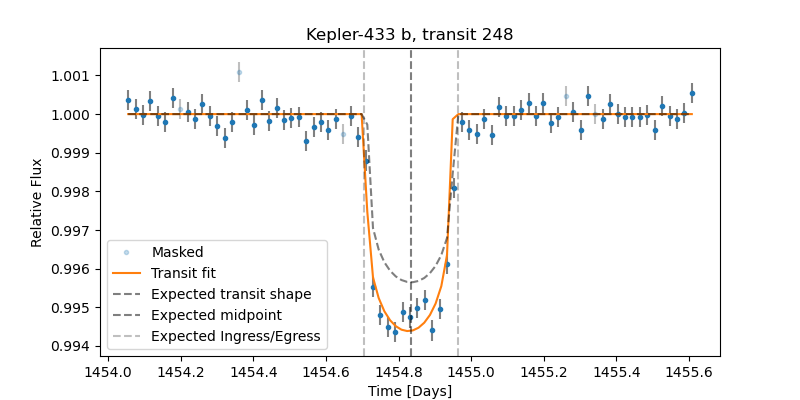

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


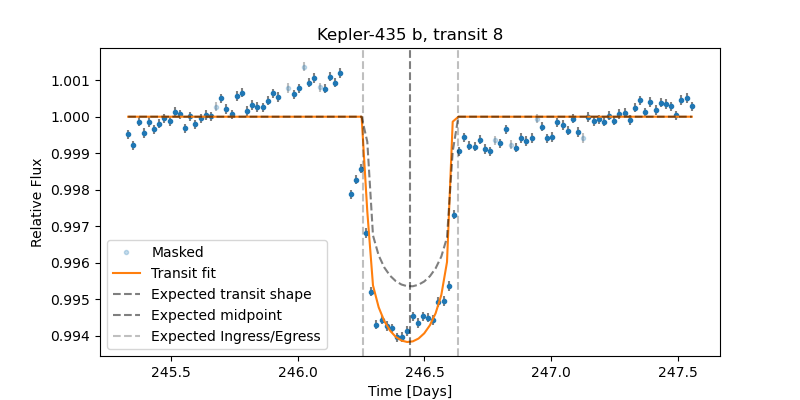

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


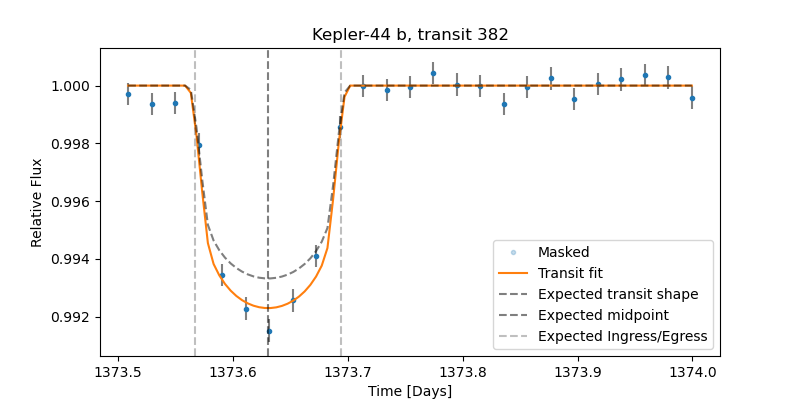

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


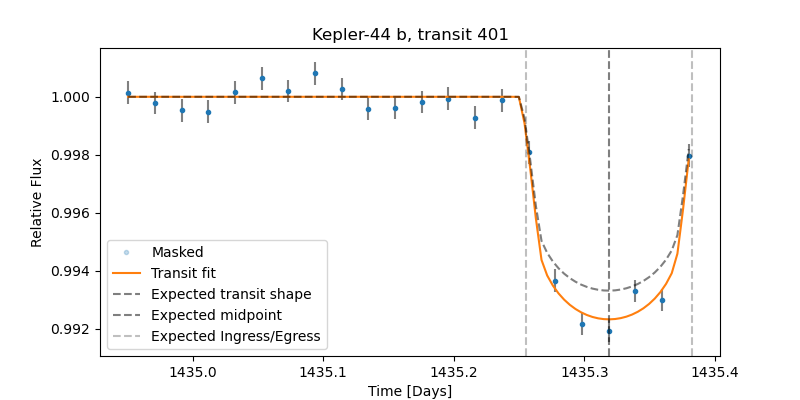

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


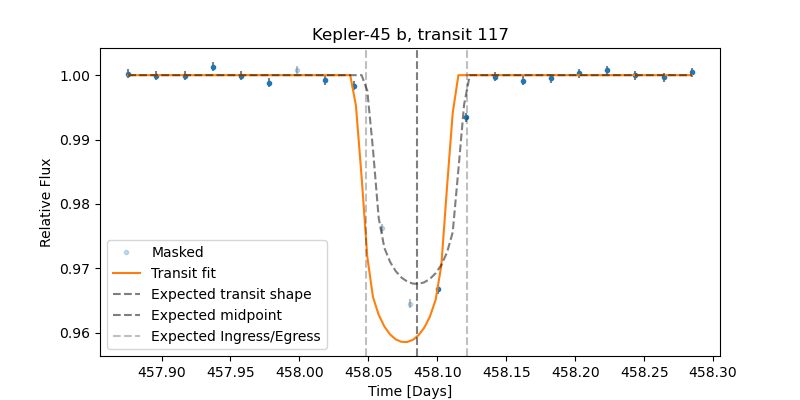

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1



You have reached transit 40!



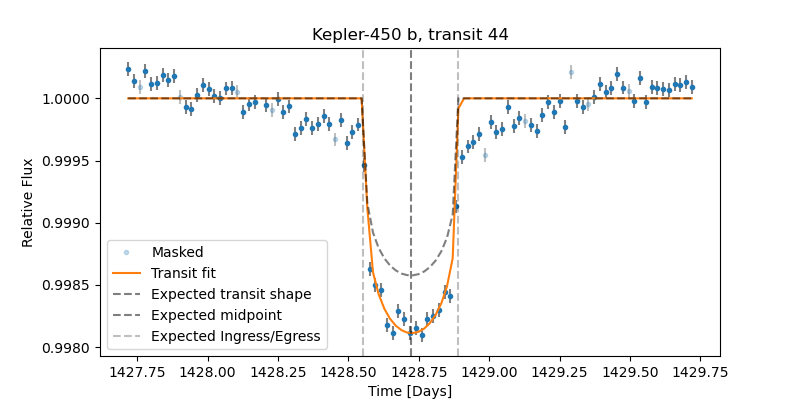

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


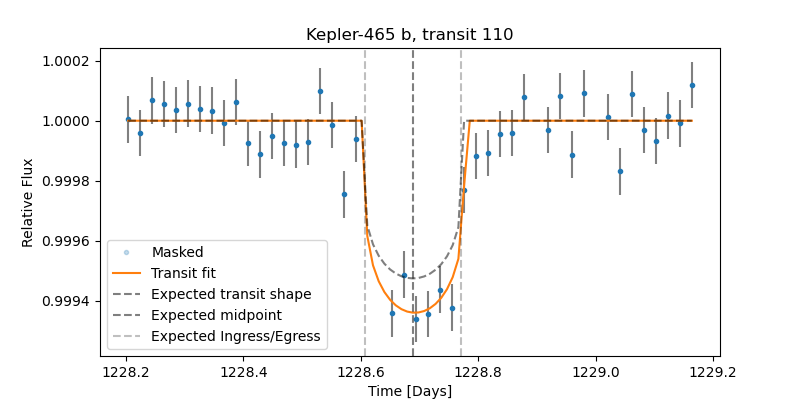

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


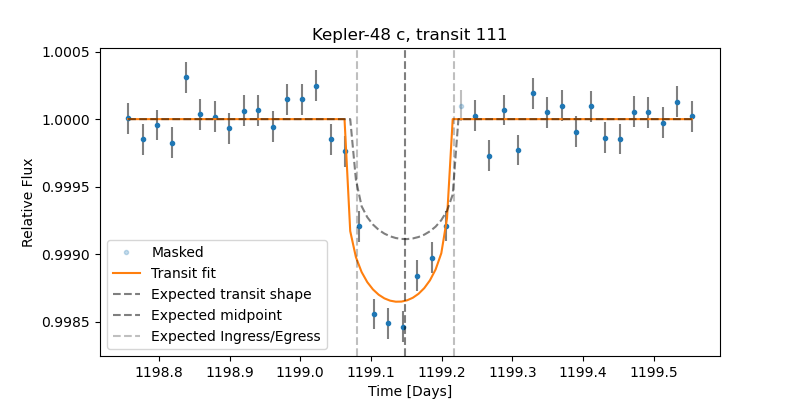

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


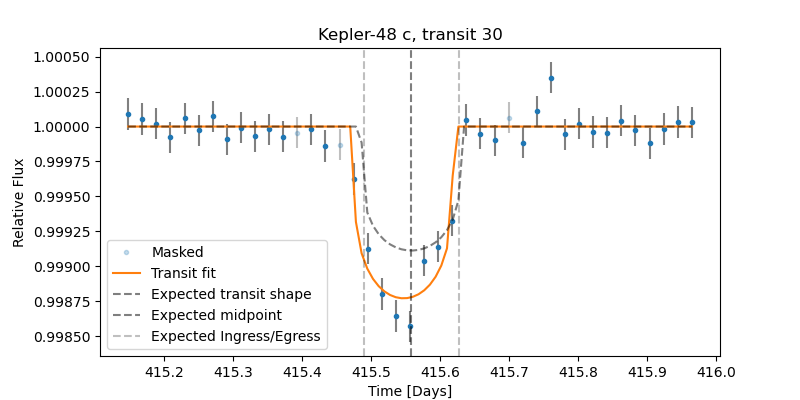

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


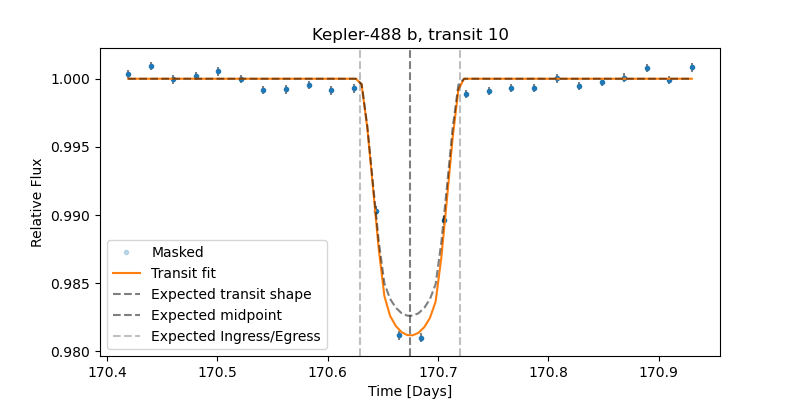

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


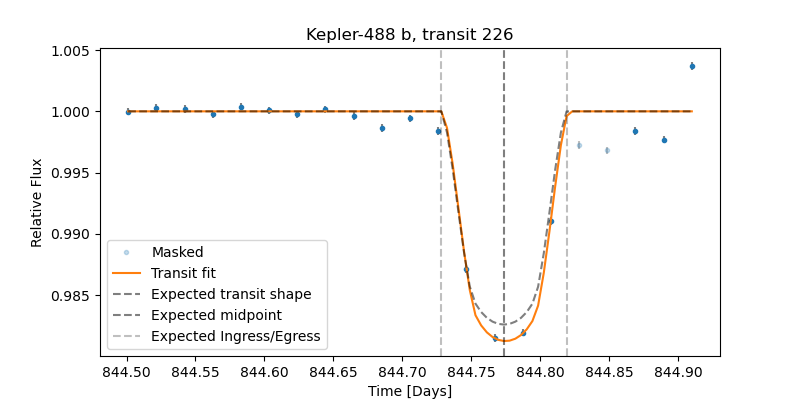

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


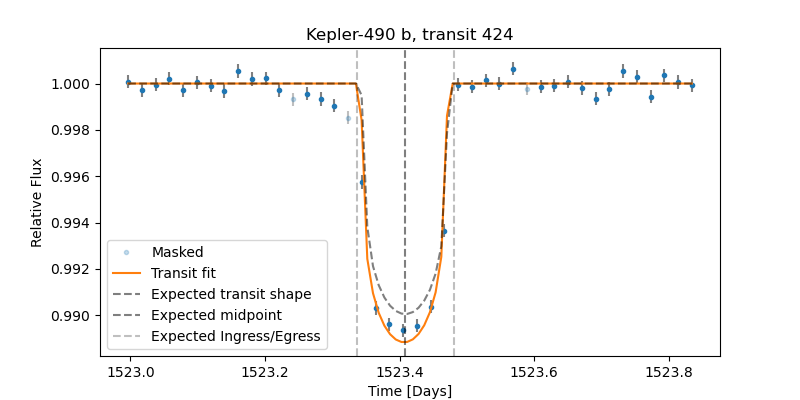

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


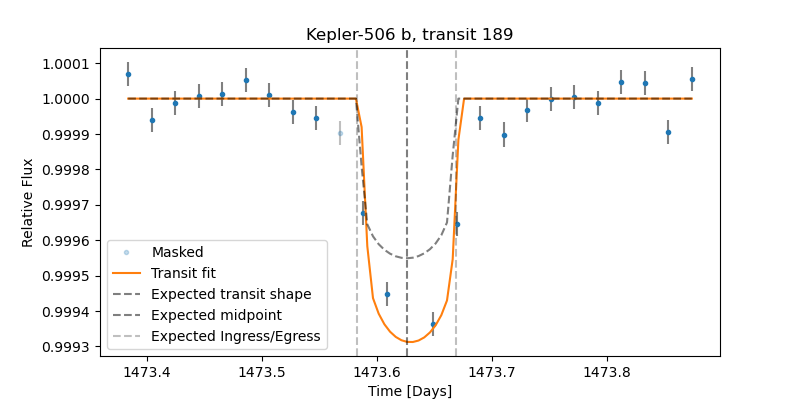

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


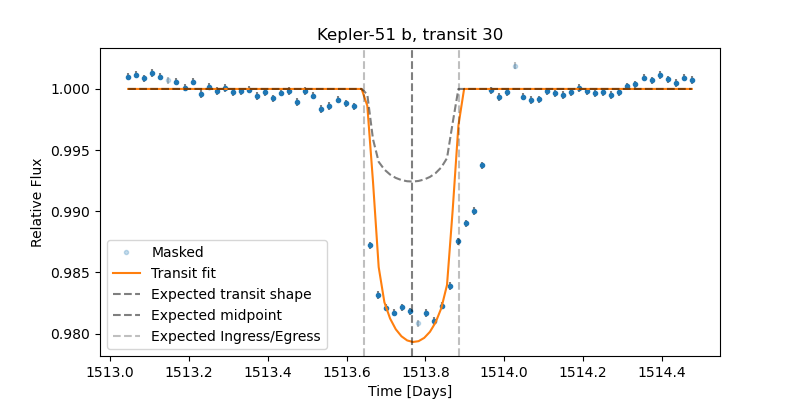

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


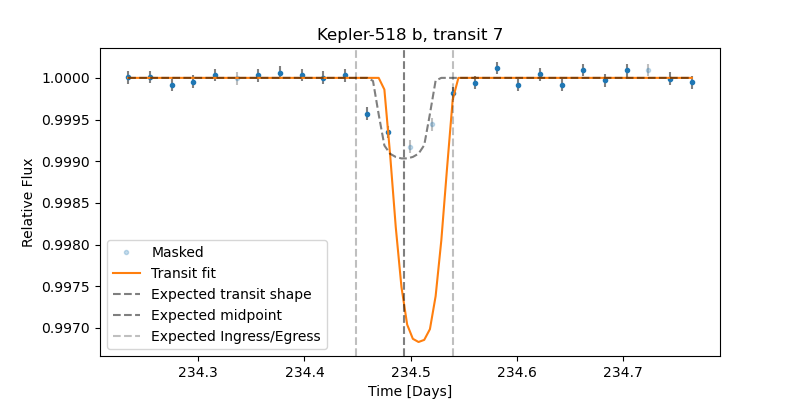

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1



You have reached transit 50!



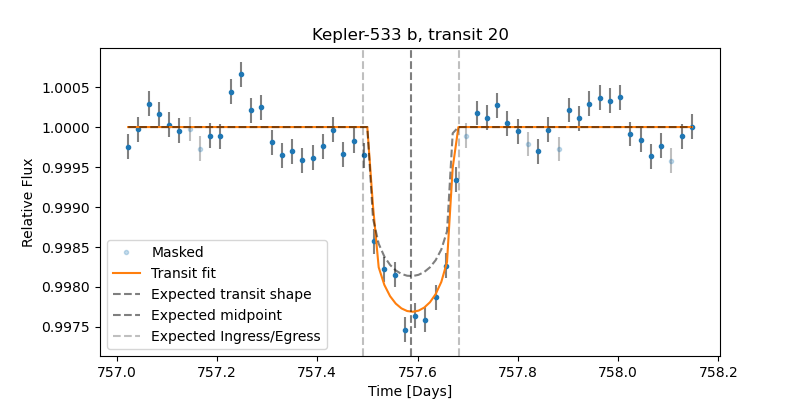

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


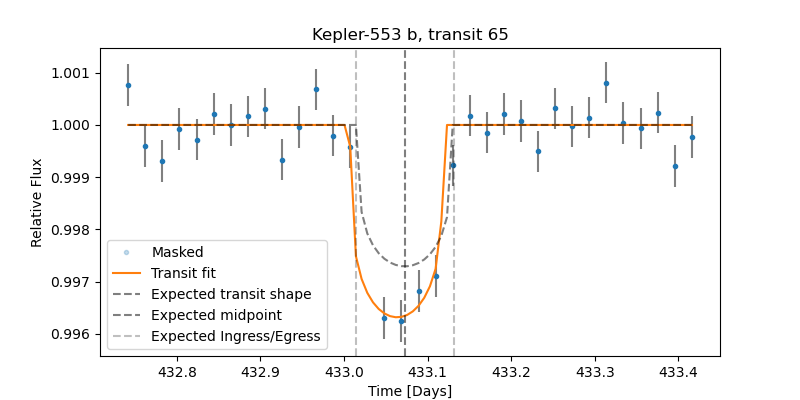

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


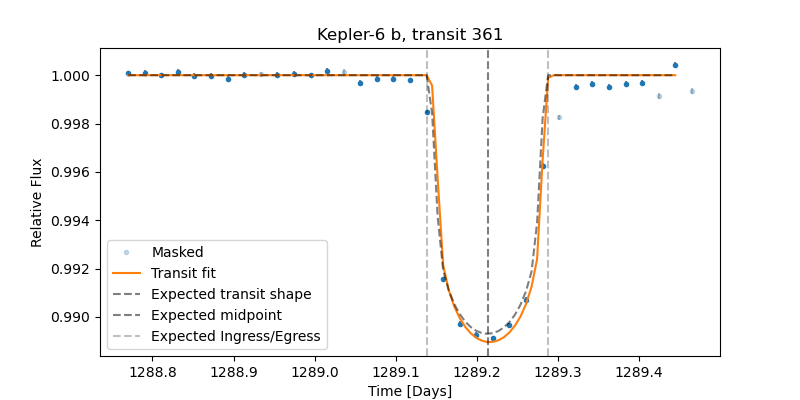

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6


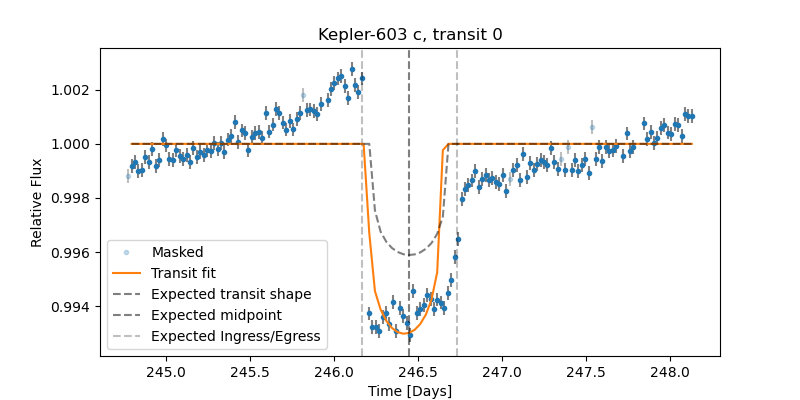

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


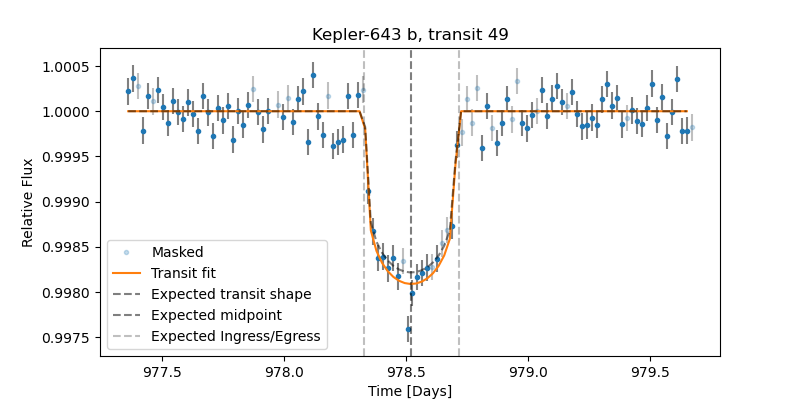

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6


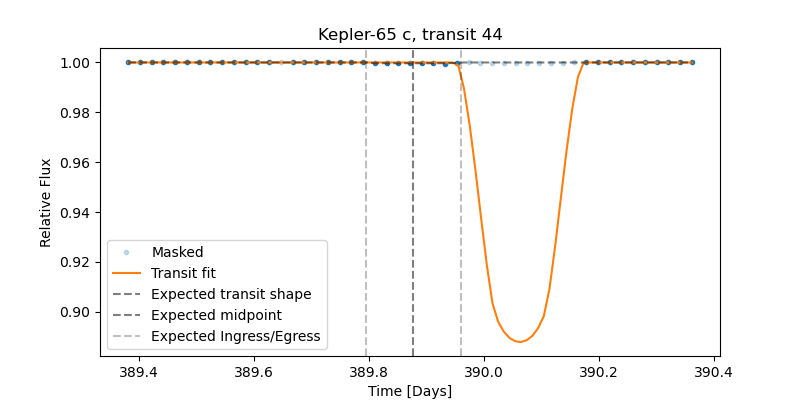

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


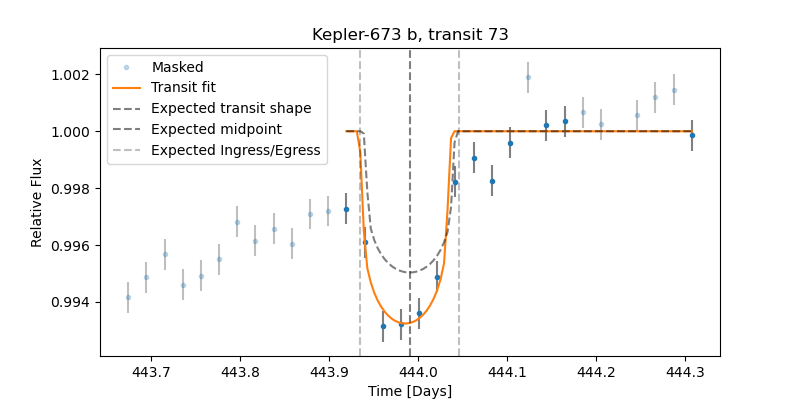

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


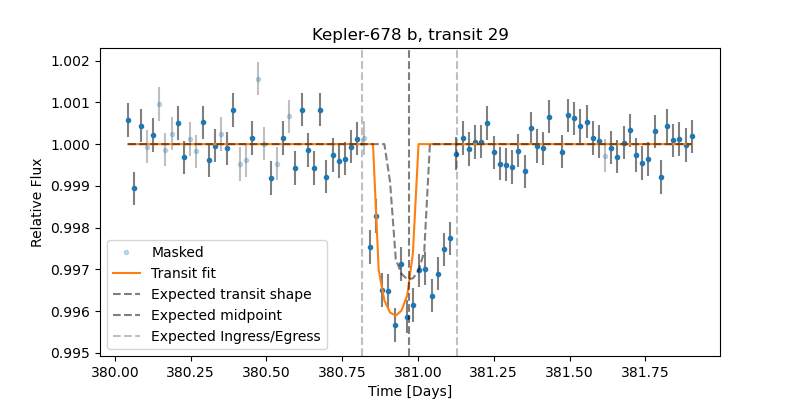

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


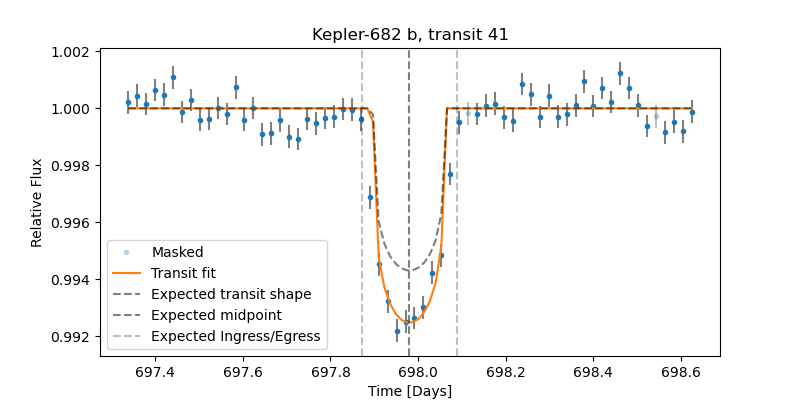

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


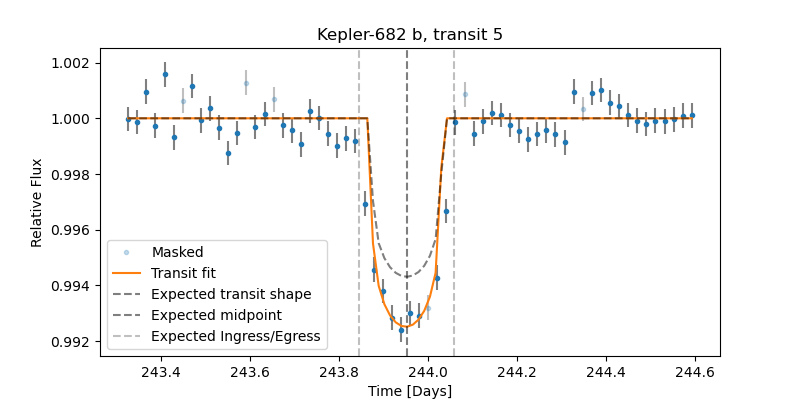

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4



You have reached transit 60!



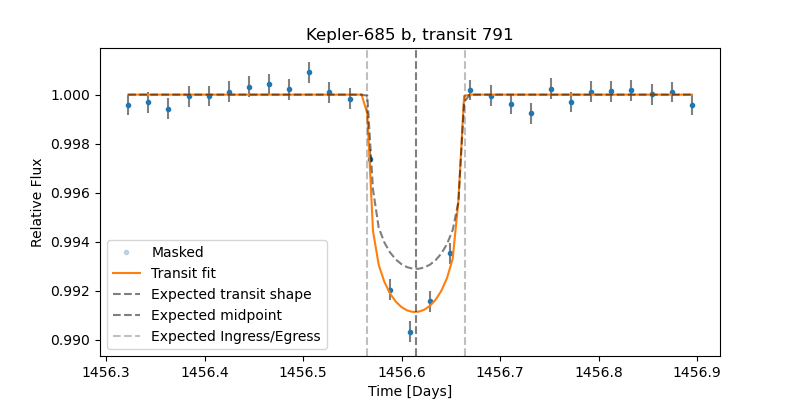

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


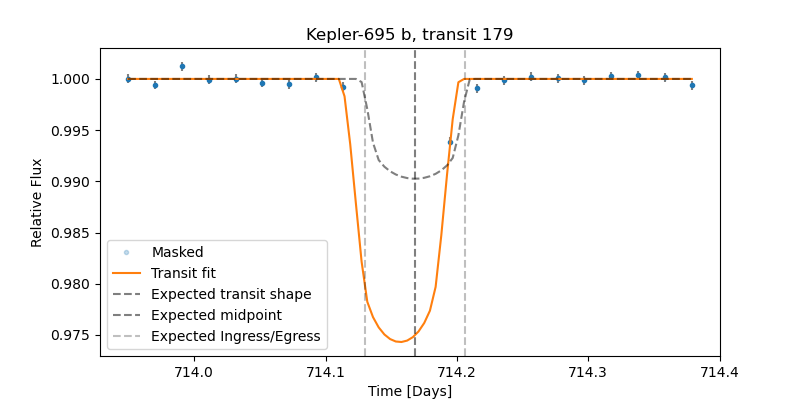

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


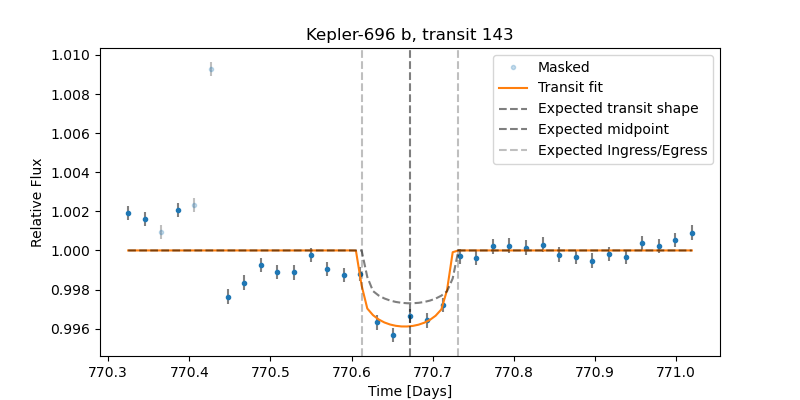

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


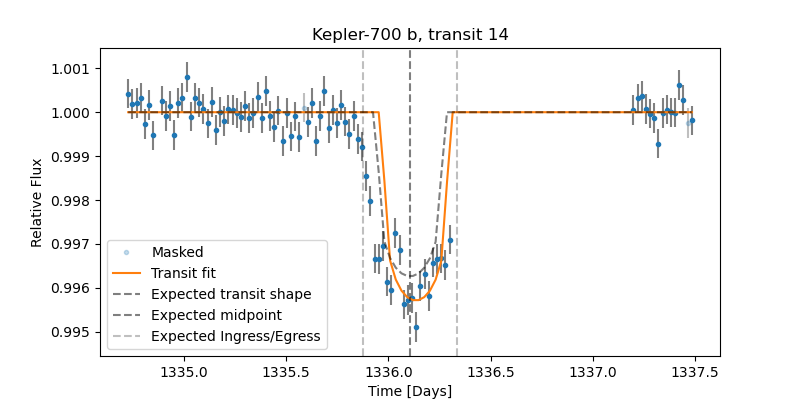

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


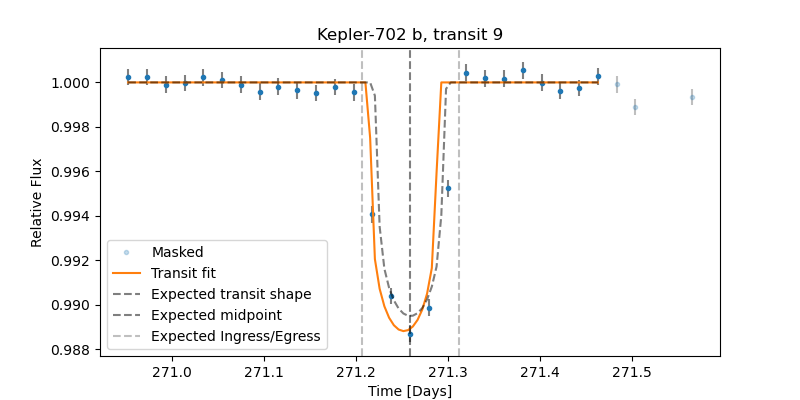

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


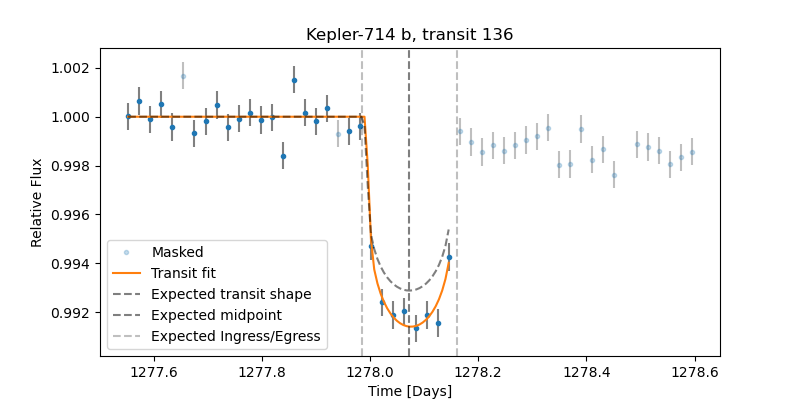

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


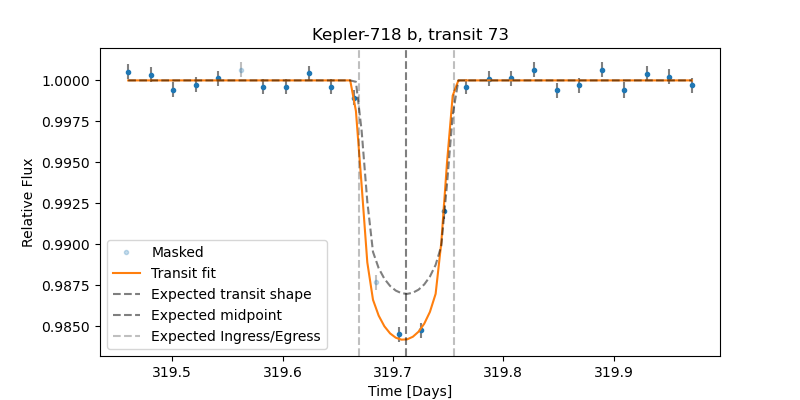

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


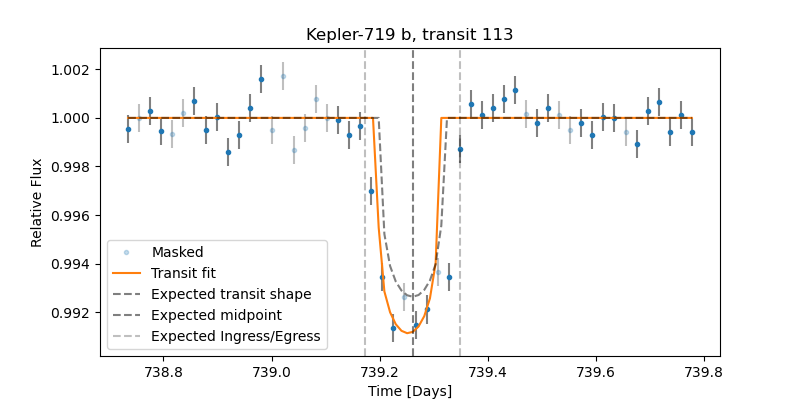

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


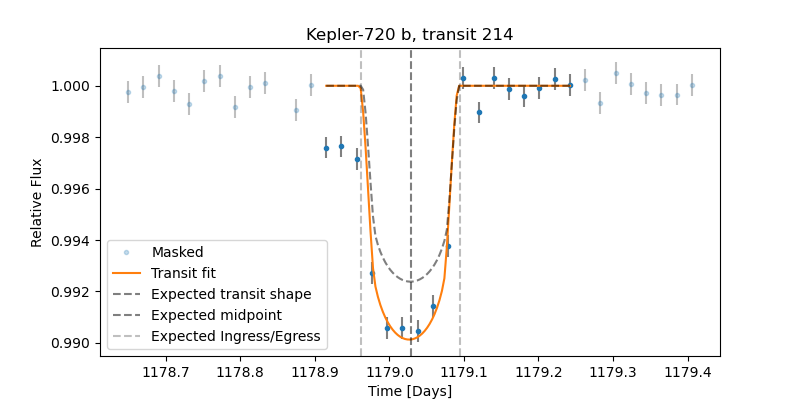

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


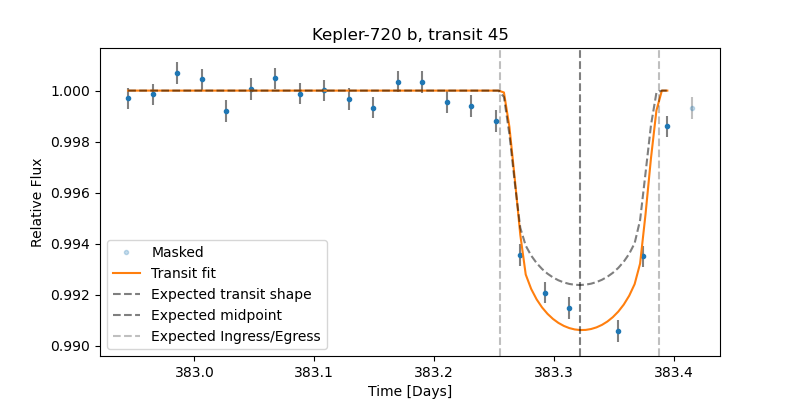

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4



You have reached transit 70!



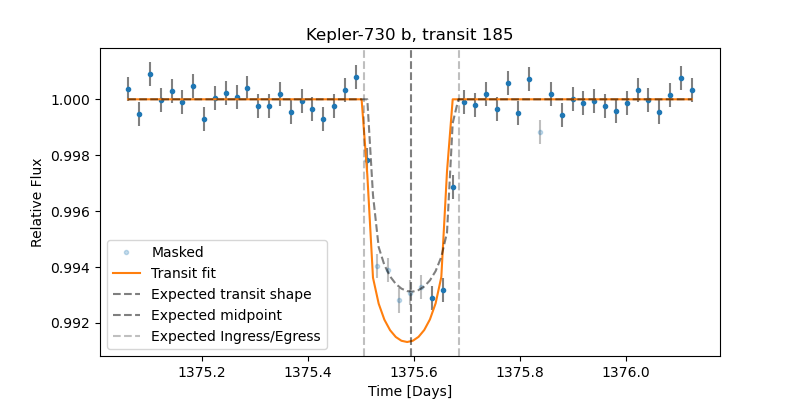

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


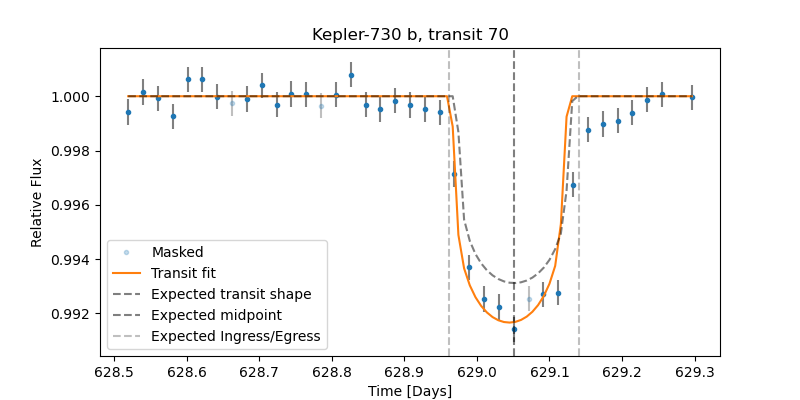

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


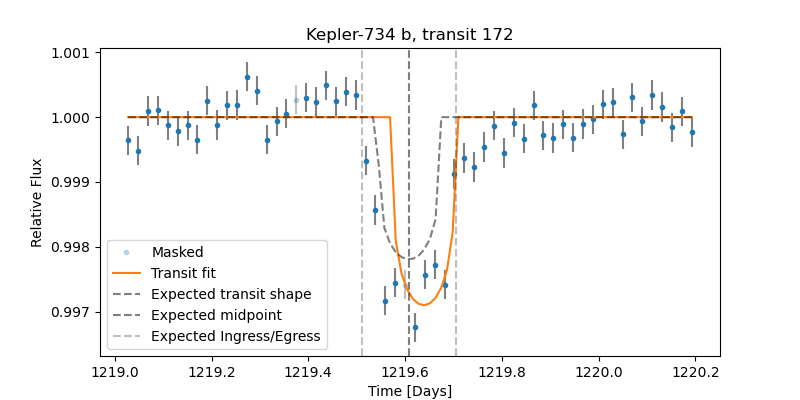

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


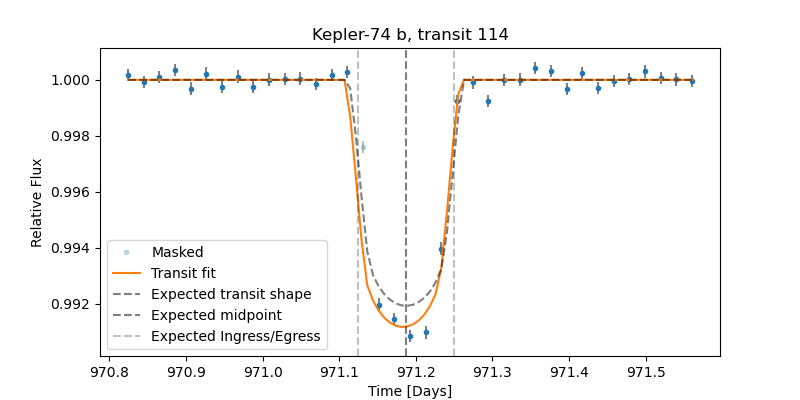

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


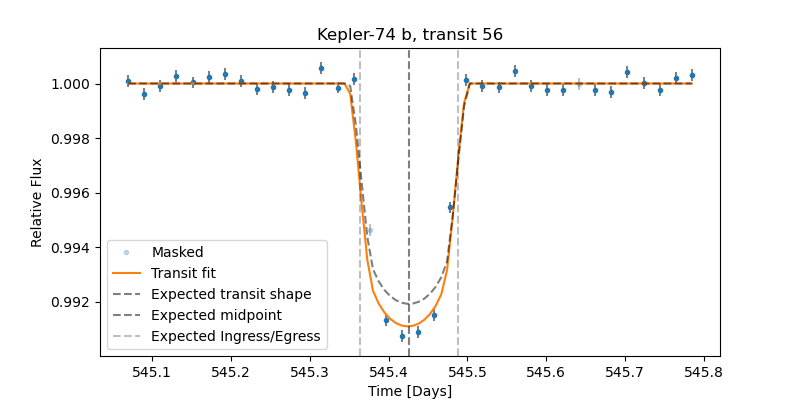

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


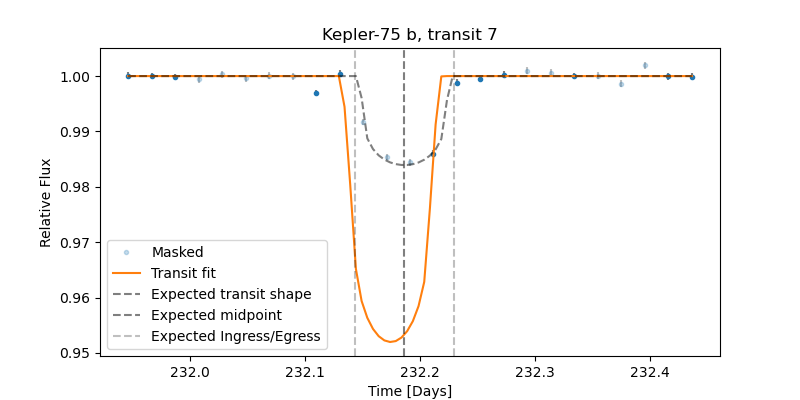

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


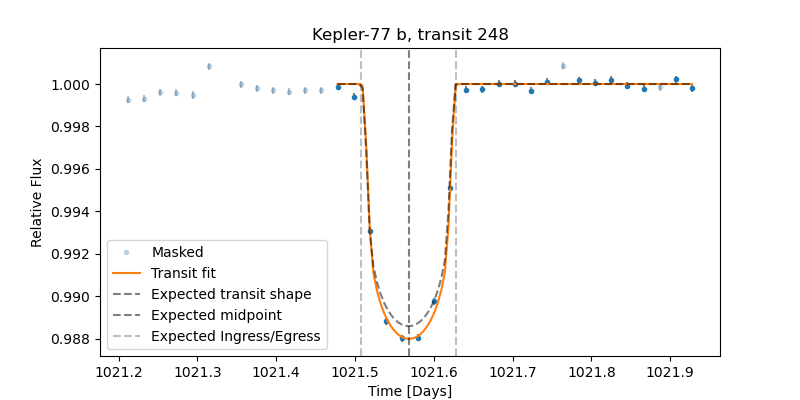

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


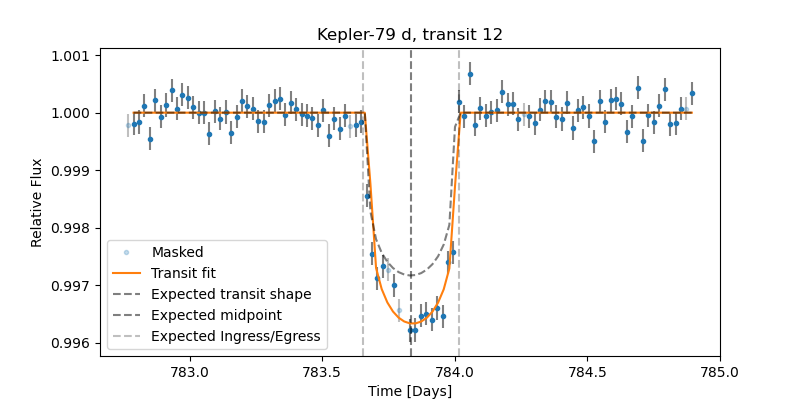

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  4


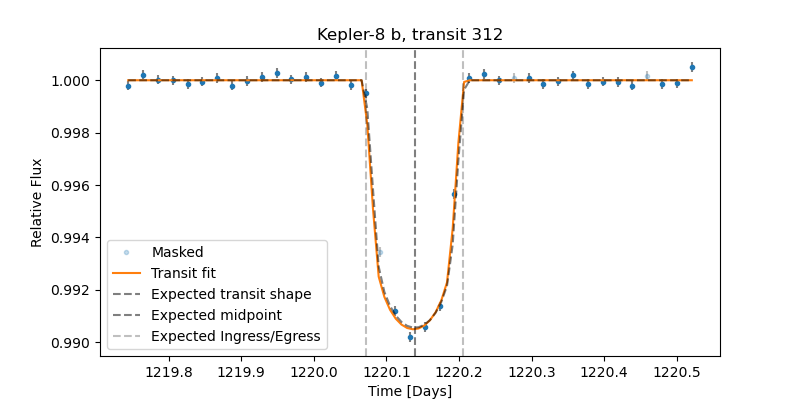

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  6


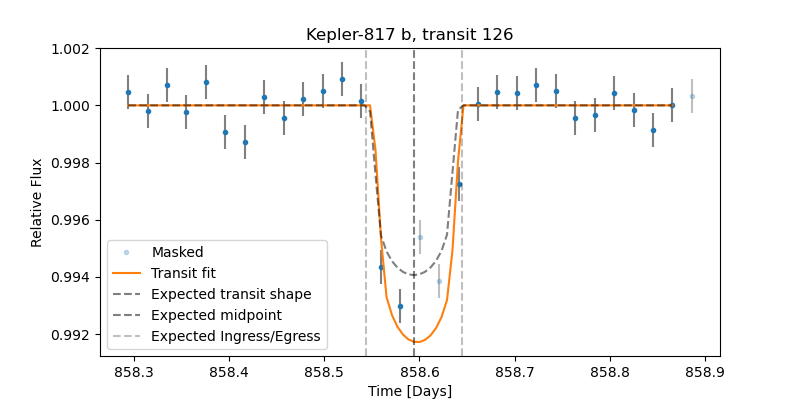

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1



You have reached transit 80!



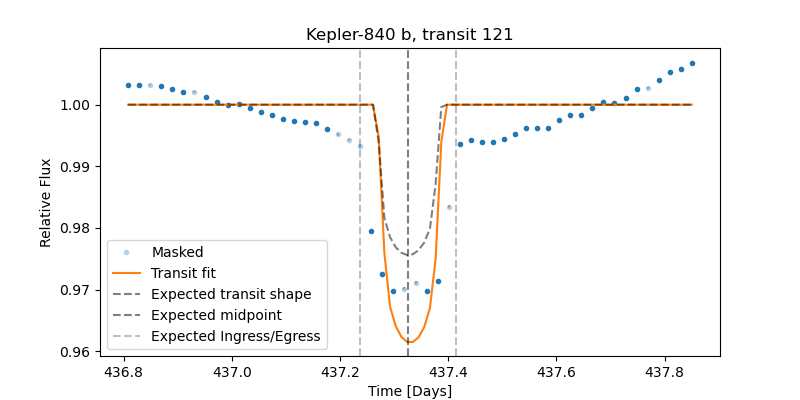

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


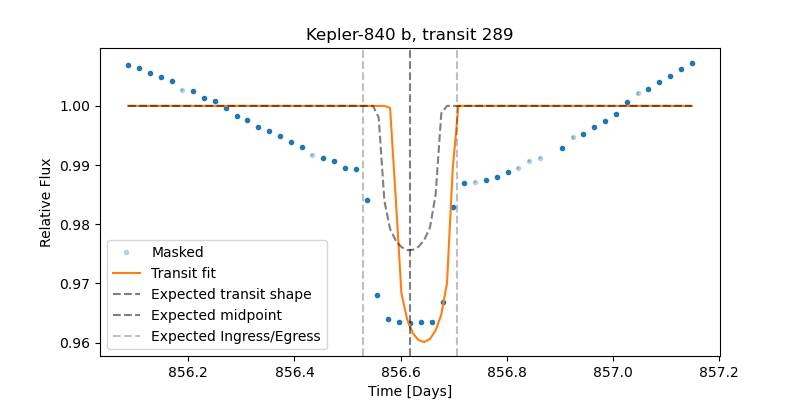

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


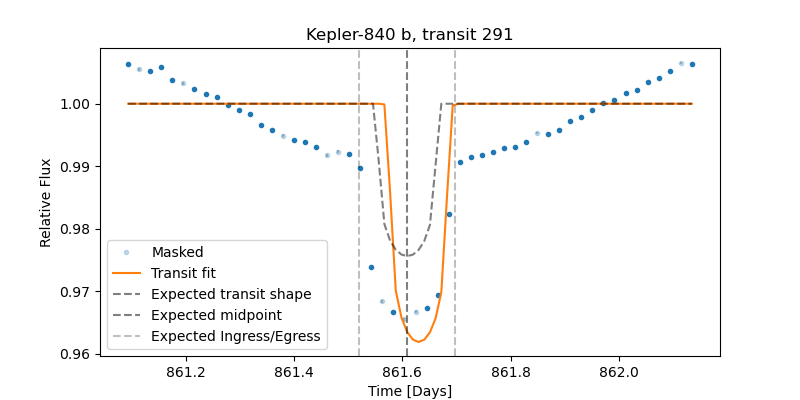

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


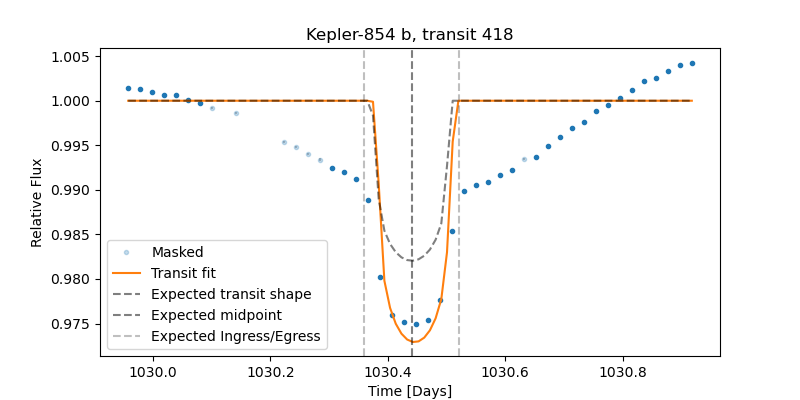

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


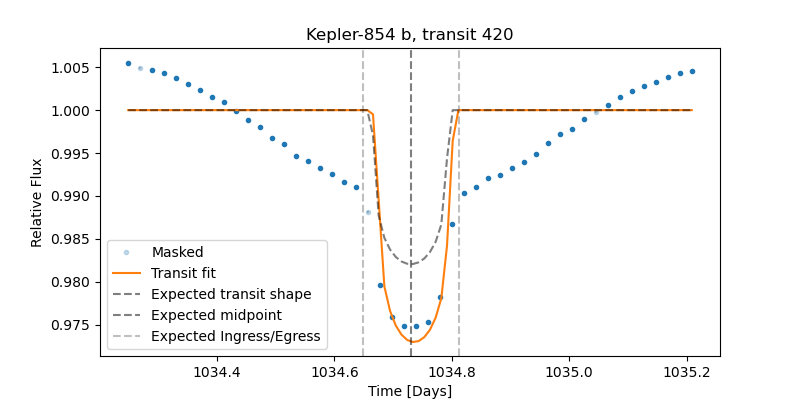

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


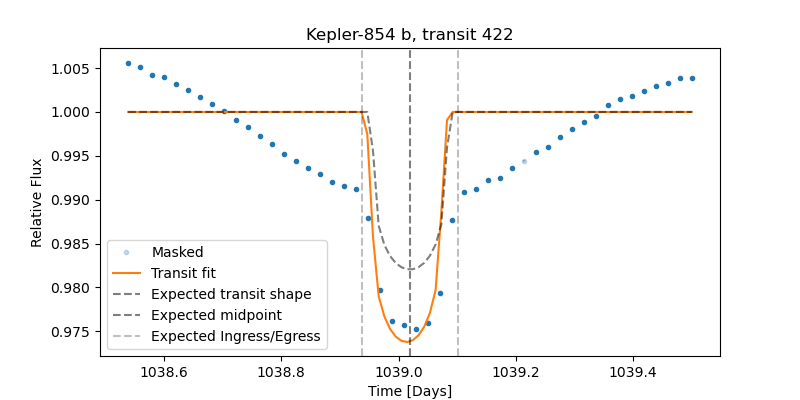

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


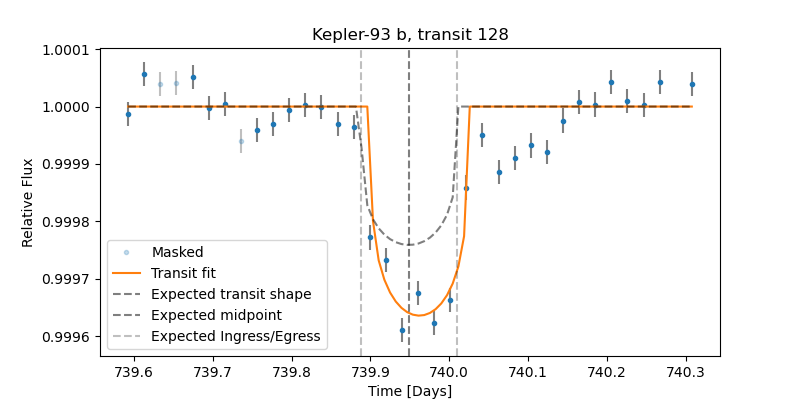

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  2


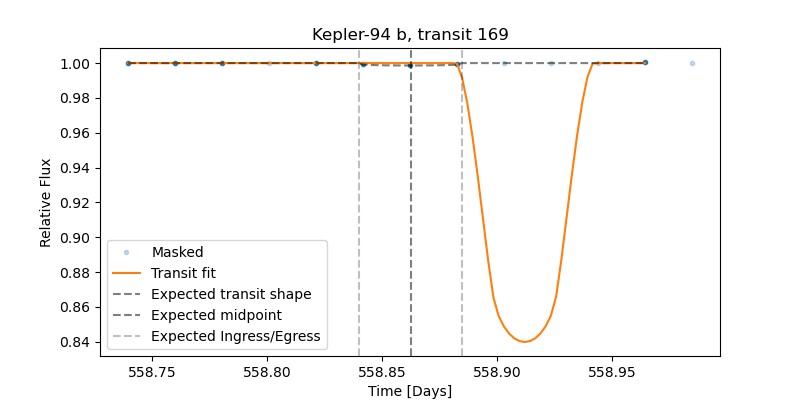

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


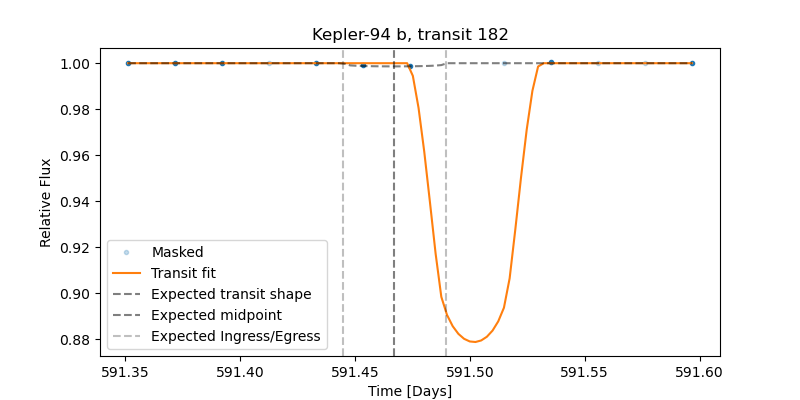

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1


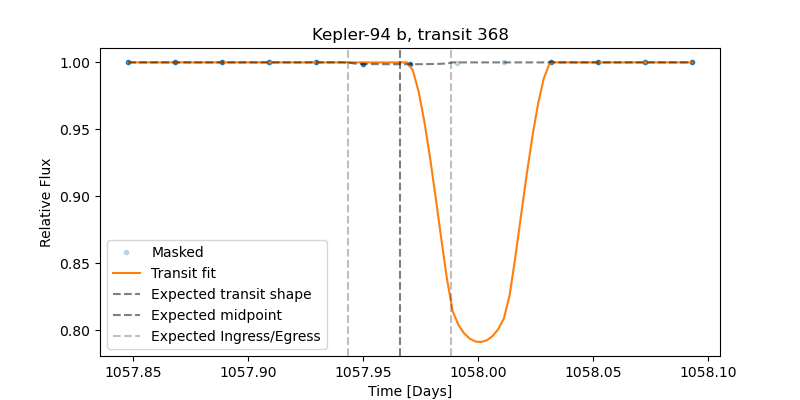

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1



You have reached transit 90!



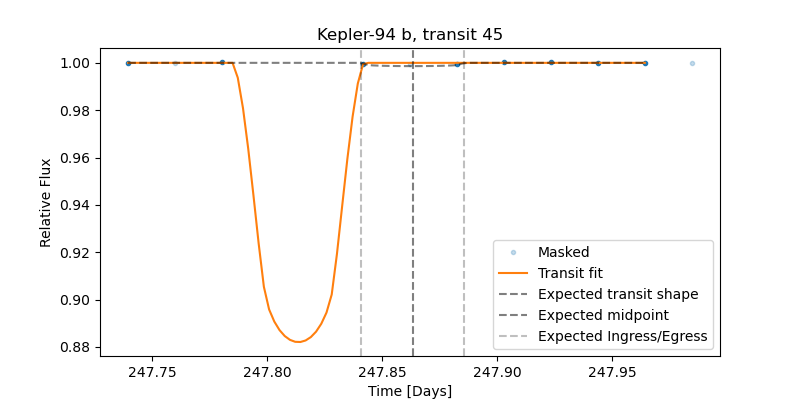

 
 1 --> significant missing data immediately around transit or data is very sparse 
 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)
 3 --> the feature it fit was not the transit 
 4 --> the large depth appears genuine
 5 --> I suspect another transit is stacked on over this one
 6 --> this doesn't look much too deep to me...
 Transit characterization (1/2/3/4/5):  1




Finished classification!


In [10]:
## define output files
dt = datetime.datetime.now()
timestamp = dt.strftime("%d") + dt.strftime("%b") + dt.strftime("%Y") + '-' + dt.strftime("%X")
out_filename = input('Enter filename to save your classification: ')
#out_filename += '_' + timestamp
if not out_filename.endswith('.txt'):
    out_filename += '.txt'

# loop over the plots of all transits flagged as missing
in_path = './Depth_flag_plots_5-30-22' # Modify this as needed 
transit_ids = [name.split('.')[0] for name in sorted(os.listdir(in_path)) if (name.endswith('.png') and not name.startswith('Kepler-76 b') and not name.startswith('Kepler-731 b'))]
visually_present = np.zeros(len(transit_ids)) * np.nan
characterizations = np.zeros(len(transit_ids)) * np.nan

for i in range(len(transit_ids)):
    transit_id = transit_ids[i]
    plot_path = in_path + '/' + transit_id + '.0.png'
    display(Image(filename=plot_path))
    #tf = False
    #while tf == False:
    #    transit_present = input('Transit is visually identifiable (y/n): ')
    #    if transit_present == 'y': visually_present[i] = 1; tf = True
    #    if transit_present == 'n': visually_present[i] = 0; tf = True
    #    else: 
    #        print('Enter y for yes or n for no.')
    tf = False
    while tf == False:
        char = input(' \n 1 --> significant missing data immediately around transit or data is very sparse ' + 
                     '\n 2 --> poor fitting (not due to missing data) (ie. mischaracterization of baseline)' + 
                     '\n 3 --> the feature it fit was not the transit ' + 
                     '\n 4 --> the large depth appears genuine' +
                     '\n 5 --> I suspect another transit is stacked on over this one' +
                     '\n 6 --> this doesn\'t look much too deep to me...' +                    
                     '\n Transit characterization (1/2/3/4/5): ')
        if (char == '1') | (char == '2') | (char == '3') | (char == '4') | (char == '5') | (char == '6') : characterizations[i] = int(char); tf = True
        else: 
            print('Enter 1, 2, 3, or 4 (see descriptions above).')
    print()
    if i % 10 == 0: print('You have reached transit ' + str(int(i)) + '!')   
    print()    
        
data = np.transpose(np.vstack([transit_ids, characterizations]))
df = pd.DataFrame(data, columns = ['Transit_ID', 'Characterization_code']) 
if os.path.exists(out_filename):
       df.to_csv(out_filename, mode = 'a', index = False, header = False)
else:
    df.to_csv(out_filename, index = False)

print('Finished classification!')

# missing_transit_classification_updated
# ttv_transit_classification_updated

### How many do we have to visually inspect further?

In [14]:
import pandas as pd
from IPython.display import Image, display
import numpy as np

#### MISSING: 

In [29]:
results = pd.read_csv('missing_classifications_5-30-22.csv')
not_present = results[results['Visually_identifiable'] == 0]['Transit_ID']
missing_sparse = results[results['Characterization_code'] == 1]['Transit_ID']
other_bad_fit = results[results['Characterization_code'] == 2]['Transit_ID']
to_inspect = results[np.invert(results['Characterization_code'] == 1) * np.invert(results['Characterization_code'] == 2)]['Transit_ID']


print('Number false positive due to missing/sparse data: ' + str(len(np.where(missing_sparse)[0])))
print('Number false positive due to other bad fitting: ' + str(len(np.where(other_bad_fit)[0])))
print('Number to visually inspect further: ' + str(len(np.where(to_inspect)[0])))


path = 'TTV_flag_plots_5-30-22'

#for transit in to_inspect:
#    plot_path = path + '/' + transit + '.0.png'
#    display(Image(filename=plot_path))

Number false positive due to missing/sparse data: 2
Number false positive due to other bad fitting: 2
Number to visually inspect further: 2


/home/azuckerman/.local/lib/python3.7/site-packages/pandas/core/computation/expressions.py:205: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  f"evaluating in Python space because the {repr(op_str)} "


#### TTV:

Number false positive due to missing/sparse data: 27
Number false positive due to other bad fitting: 9
Numver to visually inspect further: 15


/home/azuckerman/.local/lib/python3.7/site-packages/pandas/core/computation/expressions.py:205: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  f"evaluating in Python space because the {repr(op_str)} "


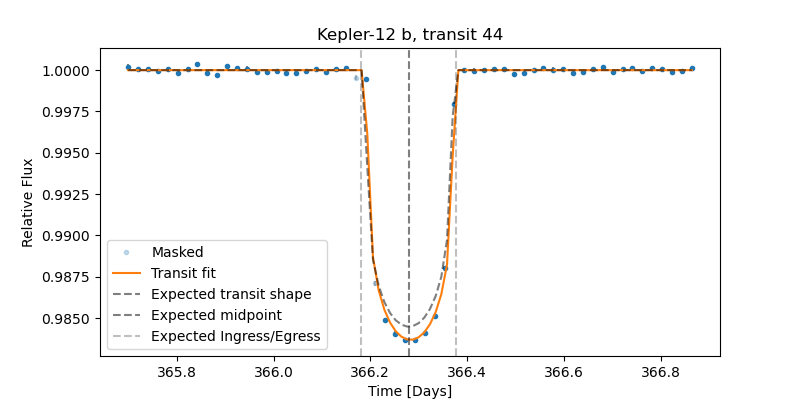

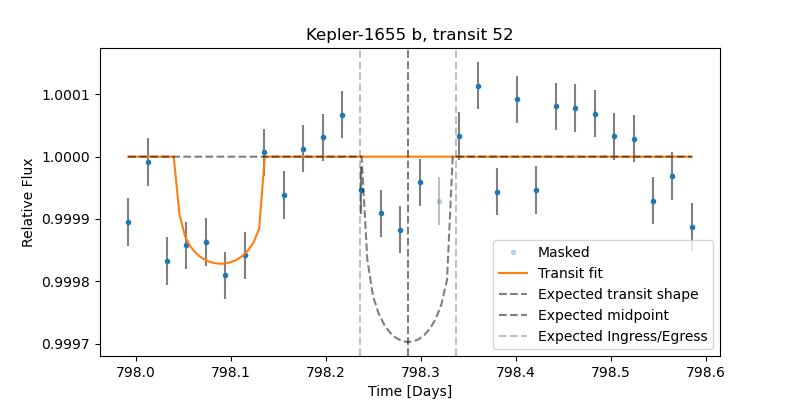

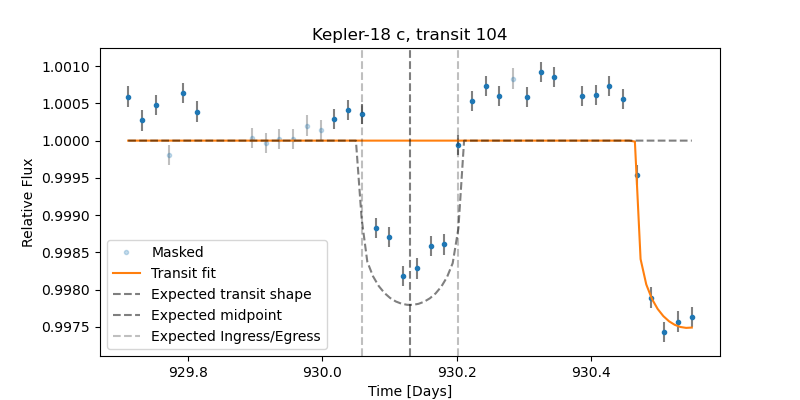

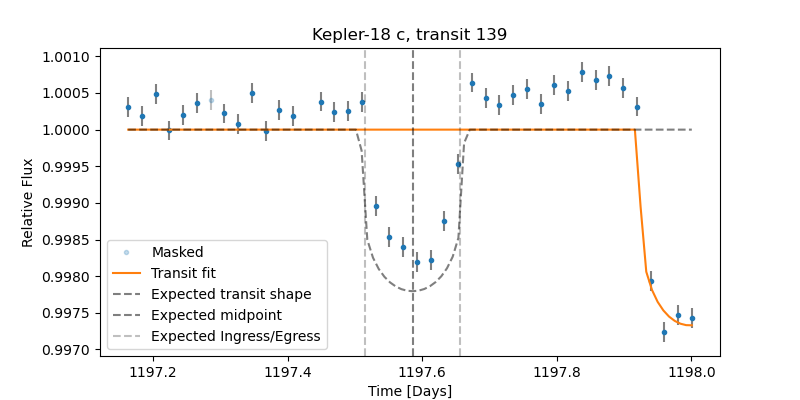

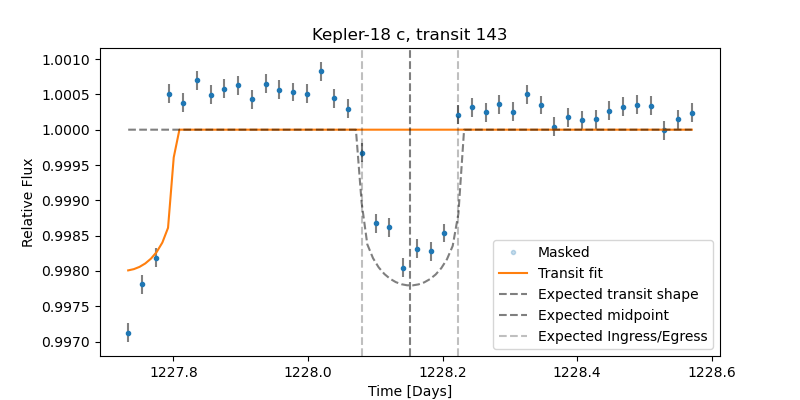

...

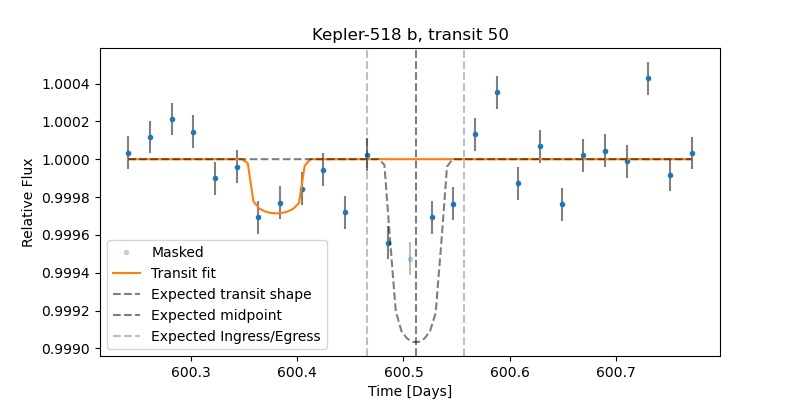

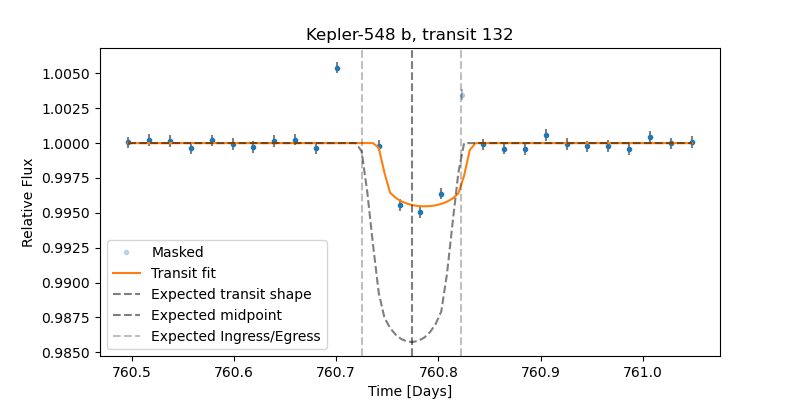

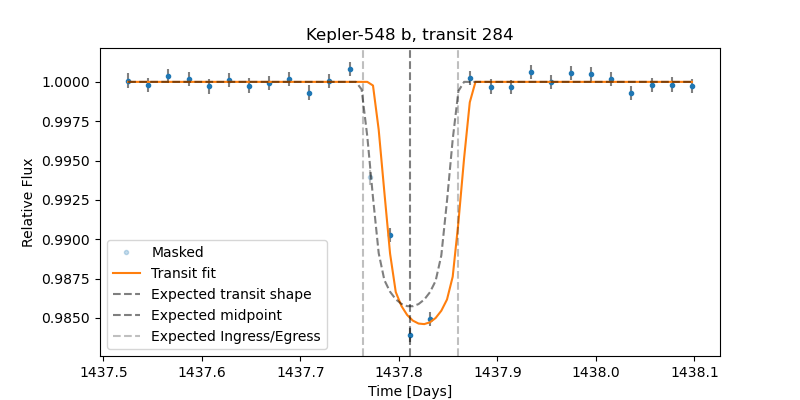

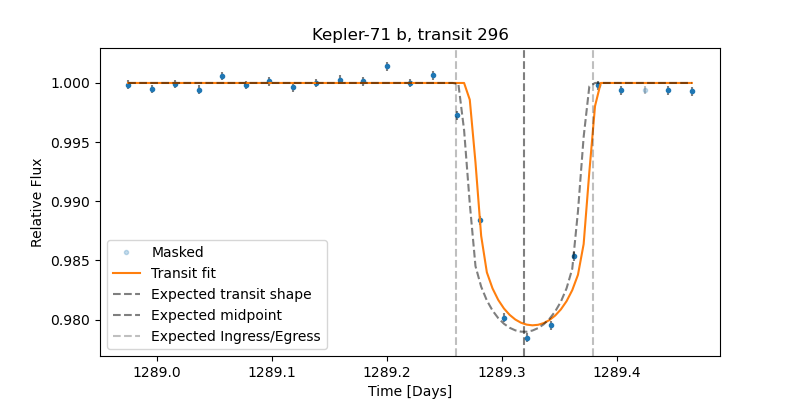

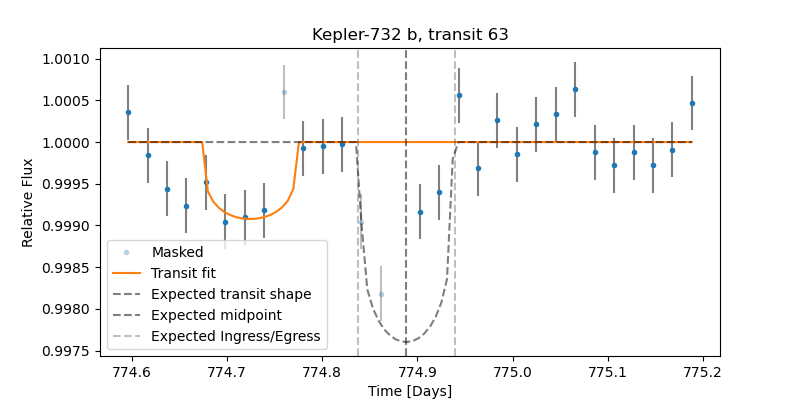

In [27]:
results = pd.read_csv('TTV_classifications_5-30-22.csv')
not_present = results[results['Visually_identifiable'] == 0]['Transit_ID']
missing_sparse = results[results['Characterization_code'] == 1]['Transit_ID']
other_bad_fit = results[results['Characterization_code'] == 2]['Transit_ID']
to_inspect = results[np.invert(results['Characterization_code'] == 1) * np.invert(results['Characterization_code'] == 2)]['Transit_ID']


print('Number false positive due to missing/sparse data: ' + str(len(np.where(missing_sparse)[0])))
print('Number false positive due to other bad fitting: ' + str(len(np.where(other_bad_fit)[0])))
print('Number to visually inspect further: ' + str(len(np.where(to_inspect)[0])))


path = 'TTV_flag_plots_5-30-22'

for transit in to_inspect:
    plot_path = path + '/' + transit + '.0.png'
    display(Image(filename=plot_path))

#### DEPTH:

Number false positive due to missing/sparse data: 23
Number false positive due to other bad fitting (this is basically the same as the next one actually): 20
Number false positive due to baseline mischaracterization: 11
Number false positive due to scatter large compared to depth excess: 19
Number to visually inspect further: 19


/home/azuckerman/.local/lib/python3.7/site-packages/pandas/core/computation/expressions.py:205: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  f"evaluating in Python space because the {repr(op_str)} "
/home/azuckerman/.local/lib/python3.7/site-packages/pandas/core/computation/expressions.py:205: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  f"evaluating in Python space because the {repr(op_str)} "
/home/azuckerman/.local/lib/python3.7/site-packages/pandas/core/computation/expressions.py:205: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  f"evaluating in Python space because the {repr(op_str)} "


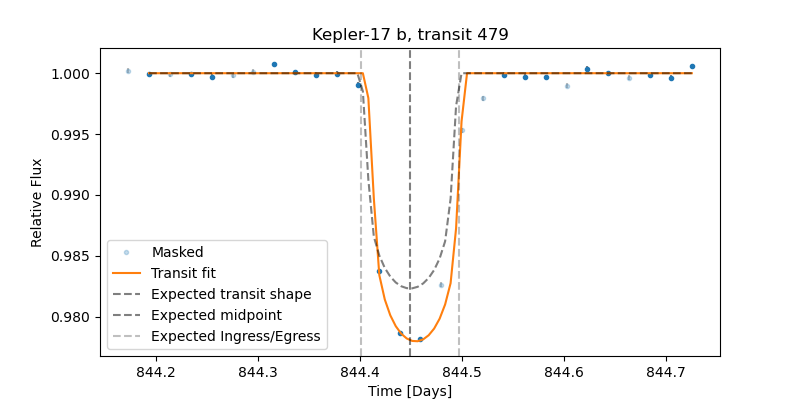

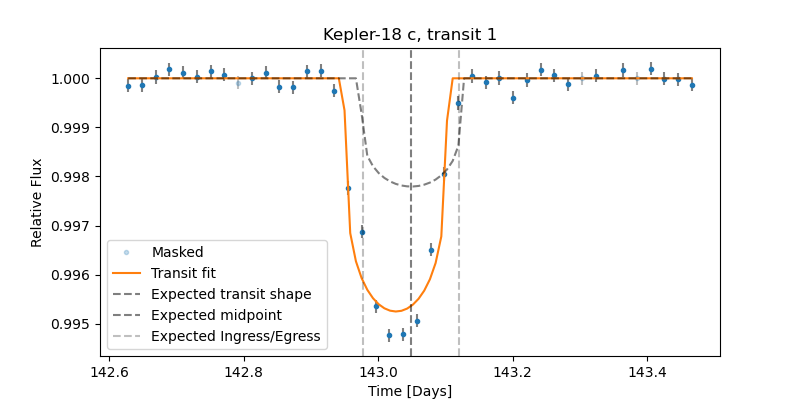

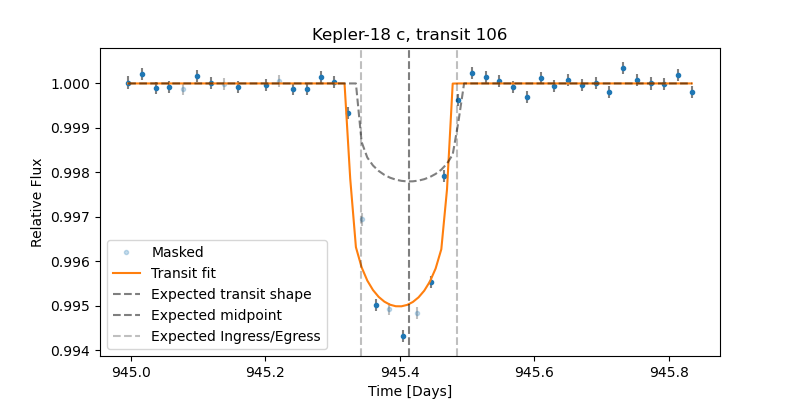

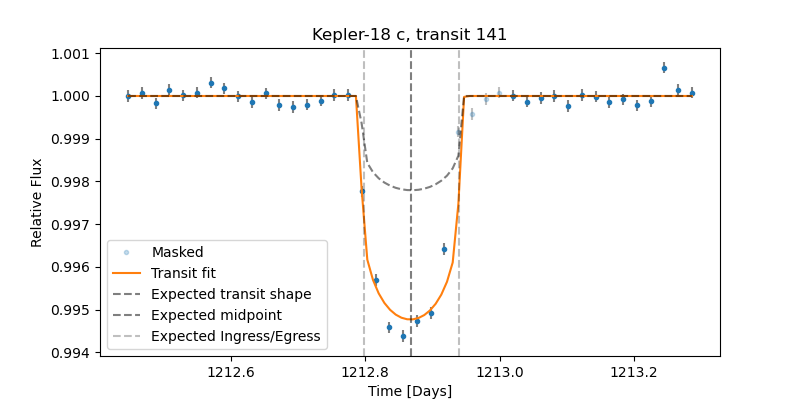

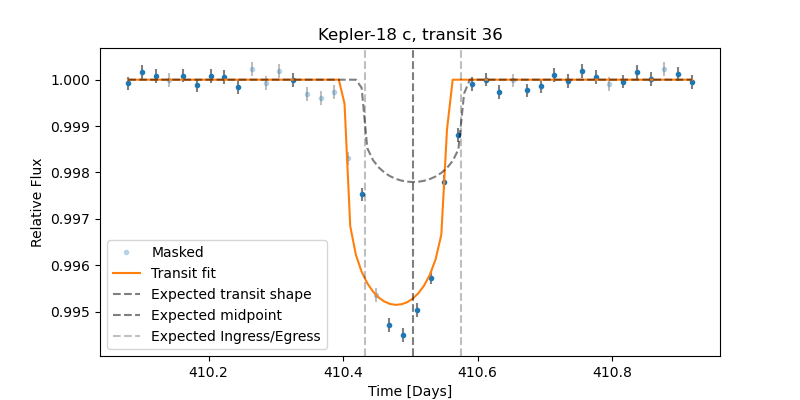

...

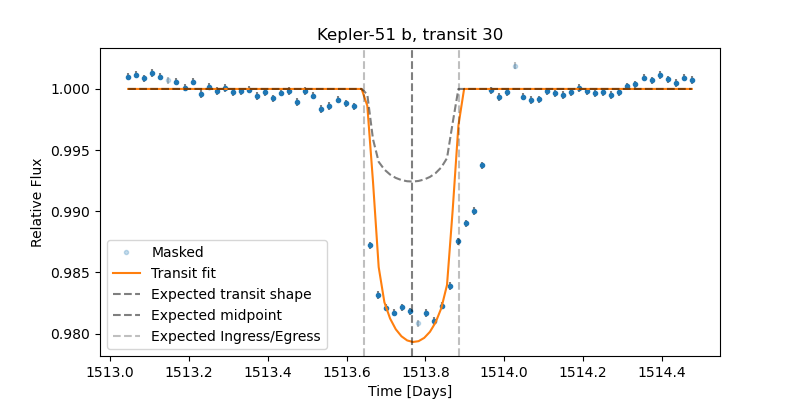

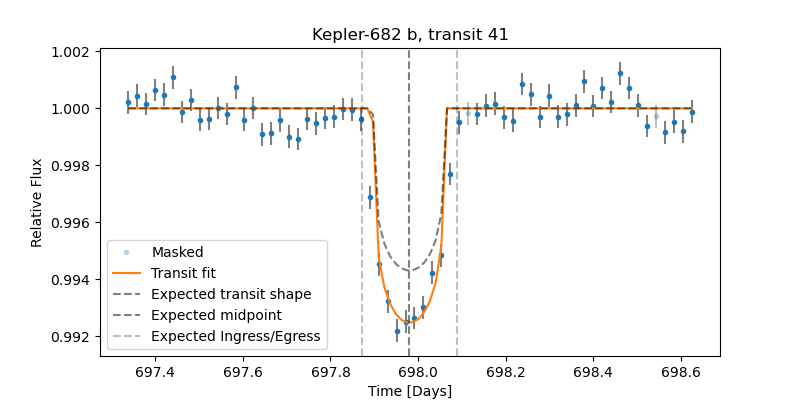

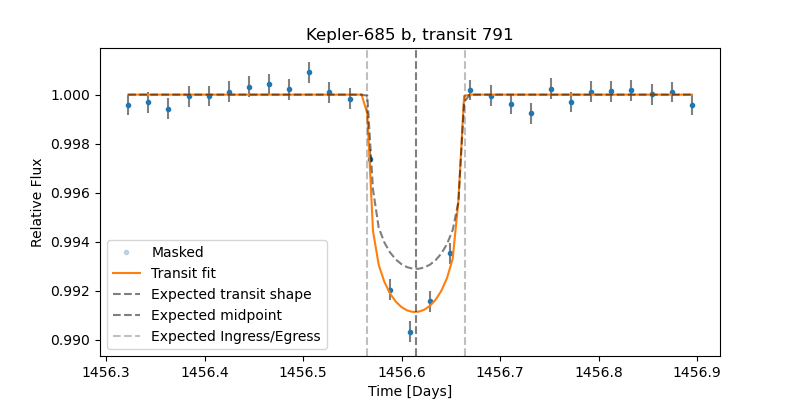

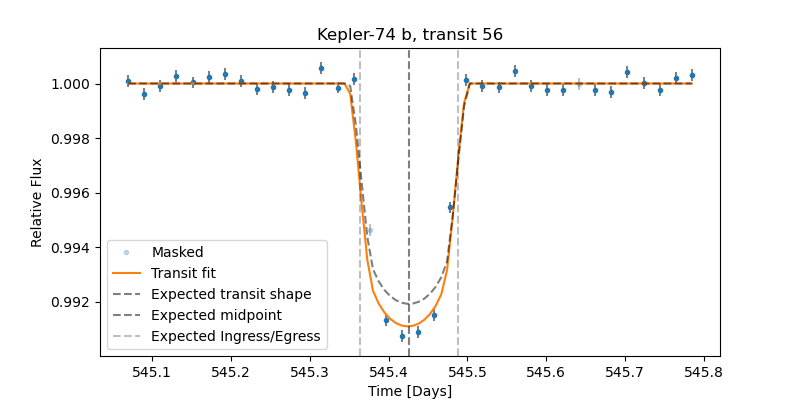

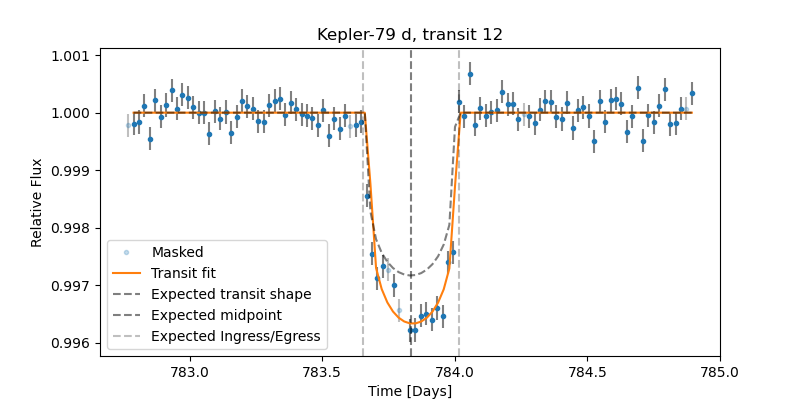

In [46]:
# NOTE: I made another characterization code, 7, for when nonlinear stellar baackground 
# leads to mischaracterization of the baseline!
# and another one, 8, for scatter on order of difference mean to fit depth

results = pd.read_csv('depth_classification_5-30-22.csv')
#not_present = results[results['Visually_identifiable'] == 0]['Transit_ID']
missing_sparse = results[results['Characterization_code'] == 1]['Transit_ID']
other_bad_fit = results[results['Characterization_code'] == 2]['Transit_ID']
baseline_mischar = results[results['Characterization_code'] == 7]['Transit_ID']
scatter_large = results[results['Characterization_code'] == 8]['Transit_ID']
to_inspect = results[np.invert(results['Characterization_code'] == 1) * np.invert(results['Characterization_code'] == 2) * np.invert(results['Characterization_code'] == 8) * np.invert(results['Characterization_code'] == 7)]['Transit_ID']

print('Number false positive due to missing/sparse data: ' + str(len(np.where(missing_sparse)[0])))
print('Number false positive due to other bad fitting (this is basically the same as the next one actually): ' + str(len(np.where(other_bad_fit)[0])))
print('Number false positive due to baseline mischaracterization: ' + str(len(np.where(baseline_mischar)[0])))
print('Number false positive due to scatter large compared to depth excess: ' + str(len(np.where(scatter_large)[0])))
print('Number to visually inspect further: ' + str(len(np.where(to_inspect)[0])))


path = 'Depth_flag_plots_5-30-22'

for transit in to_inspect:
    plot_path = path + '/' + transit + '.0.png'
    display(Image(filename=plot_path))